In [1]:
# Mitochondrial Ribosome Profiling Analysis
# Analysis of translation initiation signatures in HCT-116 cells
# Comparing overlapping reading frames vs canonical mitochondrial genes

# ============================================================================
# SETUP
# ============================================================================

import os
PATH = os.path.dirname(os.path.dirname(os.getcwd()))

import mito_riboseq_analysis as mra
import mito_riboseq_analysis_extension as mrae
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from importlib import reload

# Reload module to get latest changes
reload(mra)

# Set matplotlib style
plt.style.use('seaborn-v0_8-whitegrid')
%matplotlib inline


# High-res figures for notebooks
%config InlineBackend.figure_format = 'retina'

In [2]:
# ============================================================================
# LOAD DATA
# ============================================================================
FILTER_IDs = ['gene_Overlap Region', 'gene_ATP8_ATP6', 'gene_ND4L_ND4']
# Load the ribosome profiling data
df = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hct_116', 'tables', 'mito_cumsum_table_with_gene_ids.csv'))
df_cyto = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hct_116_cytoribo', 'tables', 'mito_cumsum_table_with_gene_ids.csv'))
df_init = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hek_ini', 'tables', 'mito_cumsum_table_with_gene_ids.csv'))
df_init_mito_settings = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hek_ini_mito_setting', 'tables', 'mito_cumsum_table_with_gene_ids.csv'))
df_init_if3 = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hek_ini_mtif3_ko', 'tables', 'mito_cumsum_table_with_gene_ids.csv'))
df_per_pos = mra.load_and_prepare_data(os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hct_116', 'codon_count', 'All_codoncount_table.txt'), sep='\t')

# Drop SAMN36415885_2_HS from df_init because it represents the control
df_init = df_init[df_init['sample'] != 'SAMN36415885_2_HS']

df['cell_line'] = 'HCT_116'
df_init['cell_line'] = 'HEK'
df_init_if3['cell_line'] = 'HEK'

print(f"Loaded {len(df)} rows of data")
print(f"\nTranscript classes:")
print(df['transcript_class'].value_counts())
print(f"\nSamples:")
print(df['sample'].unique())

# Remove all rows of gene_Overlap Region
df = df[~df['gene_id'].isin(FILTER_IDs)]
df_init = df_init[~df_init['gene_id'].isin(FILTER_IDs)]
df_init_mito_settings = df_init_mito_settings[~df_init_mito_settings['gene_id'].isin(FILTER_IDs)]
df_init_if3 = df_init_if3[~df_init_if3['gene_id'].isin(FILTER_IDs)]
df_cyto = df_cyto[~df_cyto['gene_id'].isin(FILTER_IDs)]
df_per_pos = df_per_pos[~df_per_pos['gene_id'].isin(FILTER_IDs)]


print(df_per_pos.columns)
df = df.merge(df_per_pos[['transcript_id', 'codon_index', 'codon_seq', 'sample', 'position_1_count', 'position_2_count', 'position_3_count']], on=['transcript_id', 'codon_seq','sample', 'codon_index'], how='left')
display(df)
# Print all unique samples
df_init['sample'].unique()

Loaded 9454 rows of data

Transcript classes:
transcript_class
Canonical      7604
Overlapping    1850
Name: count, dtype: int64

Samples:
['SAMN13331086_3_HS' 'SAMN13331085_1_HS']
Index(['transcript_id', 'gene_id', 'codon_seq', 'codon_index',
       'codon_count_sum', 'position_1_count', 'position_2_count',
       'position_3_count', 'sample', 'GeneSymbol', 'Class', 'Strand',
       'transcript_class'],
      dtype='object')


,transcript_id,gene_id,codon_seq,codon_index,codon_count_sum,sample,GeneSymbol,Class,Strand,RPM,RPM_normgene,RPM_cumsum,RPM_cumsum_normgene,transcript_class,cell_line,position_1_count,position_2_count,position_3_count
0,gene_MOTSc,NaN,ATG,1,1,SAMN13331086_3_HS,NaN,NaN,NaN,8.773994,0.000033,8.773994,0.000033,Overlapping,HCT_116,0.0,1.0,0.0
1,gene_MOTSc,NaN,AGG,2,0,SAMN13331086_3_HS,NaN,NaN,NaN,1.000000,0.000004,9.773994,0.000037,Overlapping,HCT_116,0.0,0.0,0.0
2,gene_MOTSc,NaN,TGG,3,35,SAMN13331086_3_HS,NaN,NaN,NaN,273.089805,0.001042,282.863800,0.001080,Overlapping,HCT_116,2.0,26.0,7.0
3,gene_MOTSc,NaN,CAA,4,49,SAMN13331086_3_HS,NaN,NaN,NaN,381.925727,0.001458,664.789527,0.002538,Overlapping,HCT_116,18.0,18.0,13.0
4,gene_MOTSc,NaN,GAA,5,116,SAMN13331086_3_HS,NaN,NaN,NaN,902.783354,0.003446,1567.572881,0.005984,Overlapping,HCT_116,72.0,37.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9449,gene_CYTB-187AA,NaN,CTC,184,0,SAMN13331085_1_HS,NaN,NaN,NaN,1.000000,0.000003,304110.769406,0.999216,Overlapping,HCT_116,0.0,0.0,0.0
9450,gene_CYTB-187AA,NaN,CCA,185,4,SAMN13331085_1_HS,NaN,NaN,NaN,26.360918,0.000087,304137.130323,0.999303,Overlapping,HCT_116,0.0,3.0,1.0
9451,gene_CYTB-187AA,NaN,TTC,186,16,SAMN13331085_1_HS,NaN,NaN,NaN,102.443670,0.000337,304239.573994,0.999639,Overlapping,HCT_116,2.0,14.0,0.0
9452,gene_CYTB-187AA,NaN,CGA,187,12,SAMN13331085_1_HS,NaN,NaN,NaN,77.082753,0.000253,304316.656746,0.999893,Overlapping,HCT_116,0.0,3.0,9.0


array(['SAMN36415886_3_HS', 'SAMN36415884_89_HS'], dtype=object)

         method transcript_class       mean         std
0  cyto_riboseq        Canonical   0.055146    0.370825
1  cyto_riboseq      Overlapping   0.071712    0.511839
2  mito_riboseq        Canonical  26.949237   54.095164
3  mito_riboseq      Overlapping  44.018919  188.403994


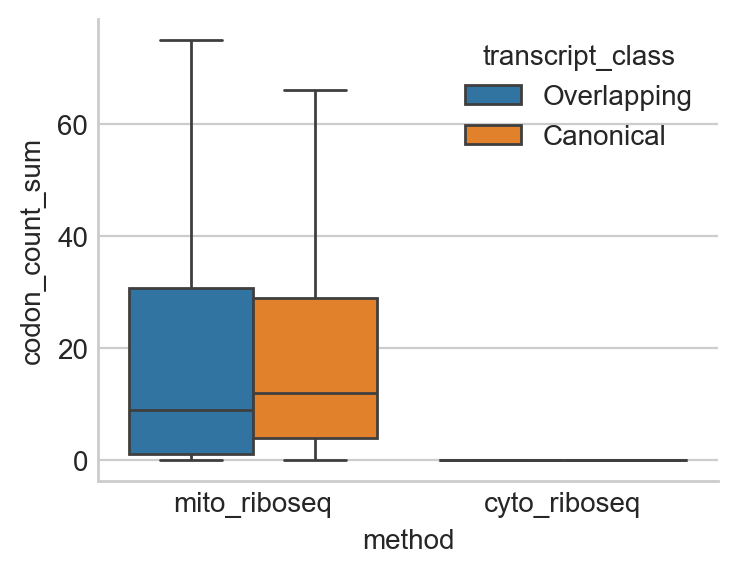

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
# Compare the codon_count_sum values betweer cyto and mito ribosome profiling
_, ax = plt.subplots(figsize=(4,3))
df['method'] = 'mito_riboseq'
df_cyto['method'] = 'cyto_riboseq'
df_merged = pd.concat([df, df_cyto], axis=0)
sns.boxplot(ax = ax, data=df_merged, x='method', y='codon_count_sum', hue='transcript_class', showfliers=False)
sns.despine()

# Compare the mean and std of the coverage
df_grouped = df_merged.groupby(['method', 'transcript_class'])['codon_count_sum'].agg(['mean', 'std']).reset_index()
print(df_grouped)

In [4]:
# Show me all the unique canonical and overlapping gene names
print("\nCanonical genes:")
print(df[df['transcript_class']=='Canonical']['gene_id'].unique())
print("\nOverlapping genes:")
print(df[df['transcript_class']=='Overlapping']['gene_id'].unique())


Canonical genes:
['ENSG00000198888' 'ENSG00000198763' 'ENSG00000198804' 'ENSG00000198712'
 'ENSG00000228253' 'ENSG00000198899' 'ENSG00000198938' 'ENSG00000198840'
 'ENSG00000212907' 'ENSG00000198886' 'ENSG00000198786' 'ENSG00000198695'
 'ENSG00000198727']

Overlapping genes:
[nan]


In [5]:
df.columns

Index(['transcript_id', 'gene_id', 'codon_seq', 'codon_index',
       'codon_count_sum', 'sample', 'GeneSymbol', 'Class', 'Strand', 'RPM',
       'RPM_normgene', 'RPM_cumsum', 'RPM_cumsum_normgene', 'transcript_class',
       'cell_line', 'position_1_count', 'position_2_count', 'position_3_count',
       'method'],
      dtype='object')

In [6]:
# ============================================================================
# QUALITY CONTROL
# ============================================================================

# Get summary statistics
stats = mra.get_transcript_summary_stats(df)

print("\n" + "="*70)
print("SUMMARY STATISTICS BY TRANSCRIPT CLASS")
print("="*70)

summary = stats.groupby('transcript_class').agg({
    'length_codons': ['count', 'mean', 'std', 'min', 'max'],
    'avg_total_rpm': ['mean', 'std'],
    'avg_mean_rpm_per_codon': ['mean', 'std']
})
display(summary)

# Show some example transcripts
print("\n" + "="*70)
print("EXAMPLE TRANSCRIPTS")
print("="*70)
print("\nOverlapping genes:")
print(stats[stats['transcript_class'] == 'Overlapping']['transcript_id'].head(10).values)
print("\nCanonical genes:")
print(stats[stats['transcript_class'] == 'Canonical']['transcript_id'].head(10).values)



SUMMARY STATISTICS BY TRANSCRIPT CLASS


length_codons                                  avg_total_rpm  \
                         count        mean         std min  max          mean   
transcript_class                                                                
Canonical                   13  292.461538  165.201703  69  604   2655.567695   

                              avg_mean_rpm_per_codon              
                          std                   mean         std  
transcript_class                                                  
Canonical         3386.880993             219.987898  125.327005


EXAMPLE TRANSCRIPTS

Overlapping genes:
[]

Canonical genes:
['ENSG00000198695' 'ENSG00000198712' 'ENSG00000198727' 'ENSG00000198763'
 'ENSG00000198786' 'ENSG00000198804' 'ENSG00000198840' 'ENSG00000198886'
 'ENSG00000198888' 'ENSG00000198899']


In [7]:
overlapping_genes = df_init[df_init['transcript_class'] == 'Overlapping']['gene_id'].unique().tolist()
canonical_genes = df_init[df_init['transcript_class'] == 'Canonical']['gene_id'].unique().tolist()

In [8]:
canonical_genes

['MT-ND1',
 'MT-ND2',
 'MT-CO1',
 'MT-CO2',
 'MT-ATP8',
 'MT-ATP6',
 'MT-CO3',
 'MT-ND3',
 'MT-ND4L',
 'MT-ND4',
 'MT-ND5',
 'MT-ND6',
 'MT-CYB']


Detected 1 peak(s) in gene_SHLP6:
   codon_position codon_seq       rpm  normalized_rpm  prominence  peak_height
0               2       TTG  0.305565       11.171024    8.907696    11.171024
No known start positions provided for gene_SHLP6. Using detected peaks only.

Enrichment at known starts:
Empty DataFrame
Columns: []
Index: []


(   codon_position codon_seq       rpm  normalized_rpm  prominence  peak_height
 0               2       TTG  0.305565       11.171024    8.907696    11.171024,
 <Figure size 800x250 with 1 Axes>)

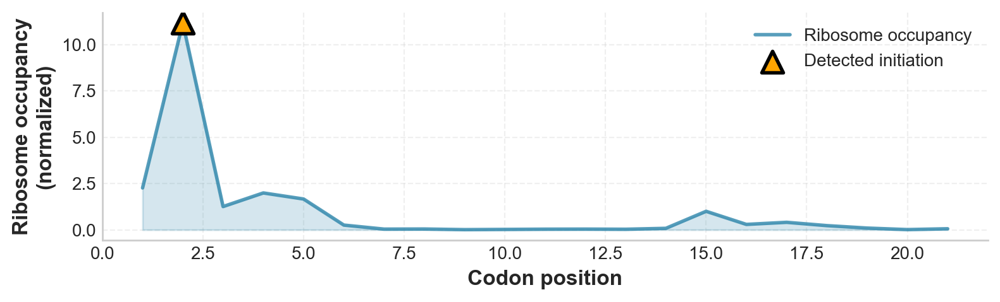

In [30]:
reload(mrae)
# Analyze initiation for a single gene
gene_id = 'gene_SHLP6'
init_data_path = os.path.join(PATH, 'data', 'mitoriboseq_analysis', 'hek_ini', 'tables', 'mito_cumsum_table_with_gene_ids.csv')
mrae.quick_initiation_analysis(table_path = init_data_path, gene_id=gene_id, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_analysis_single_gene'), figsize = (8,2.5))

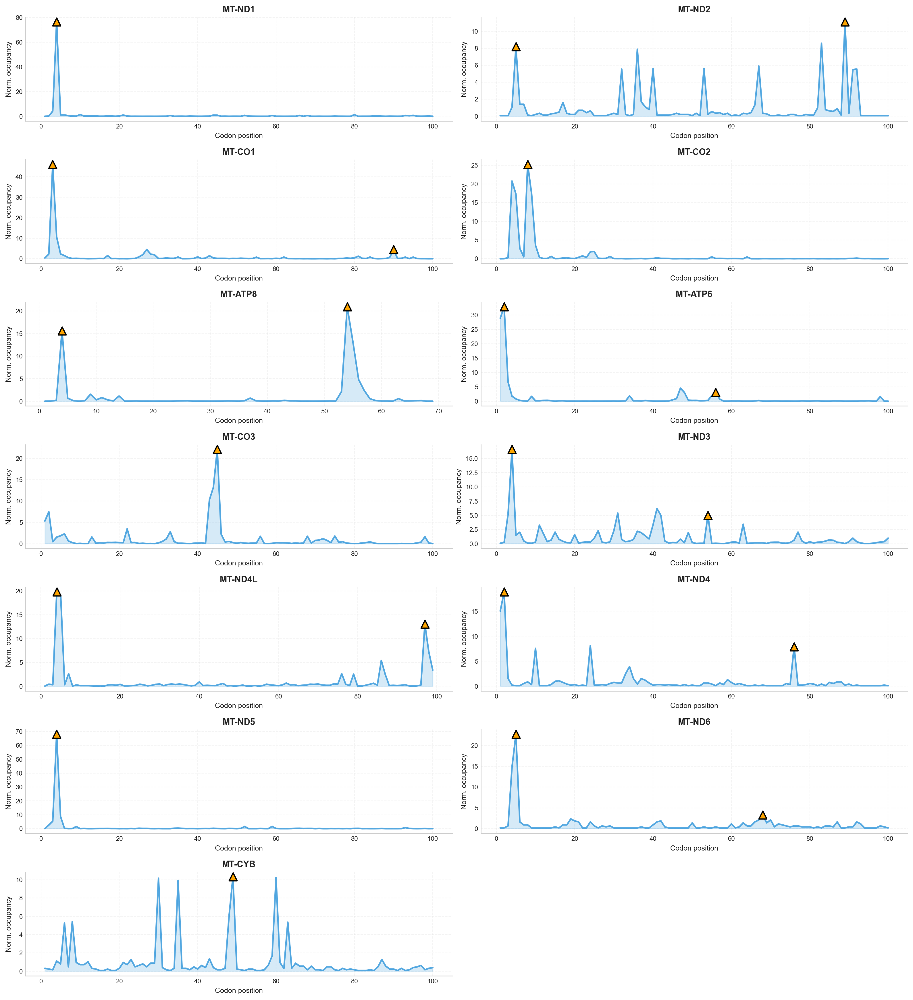

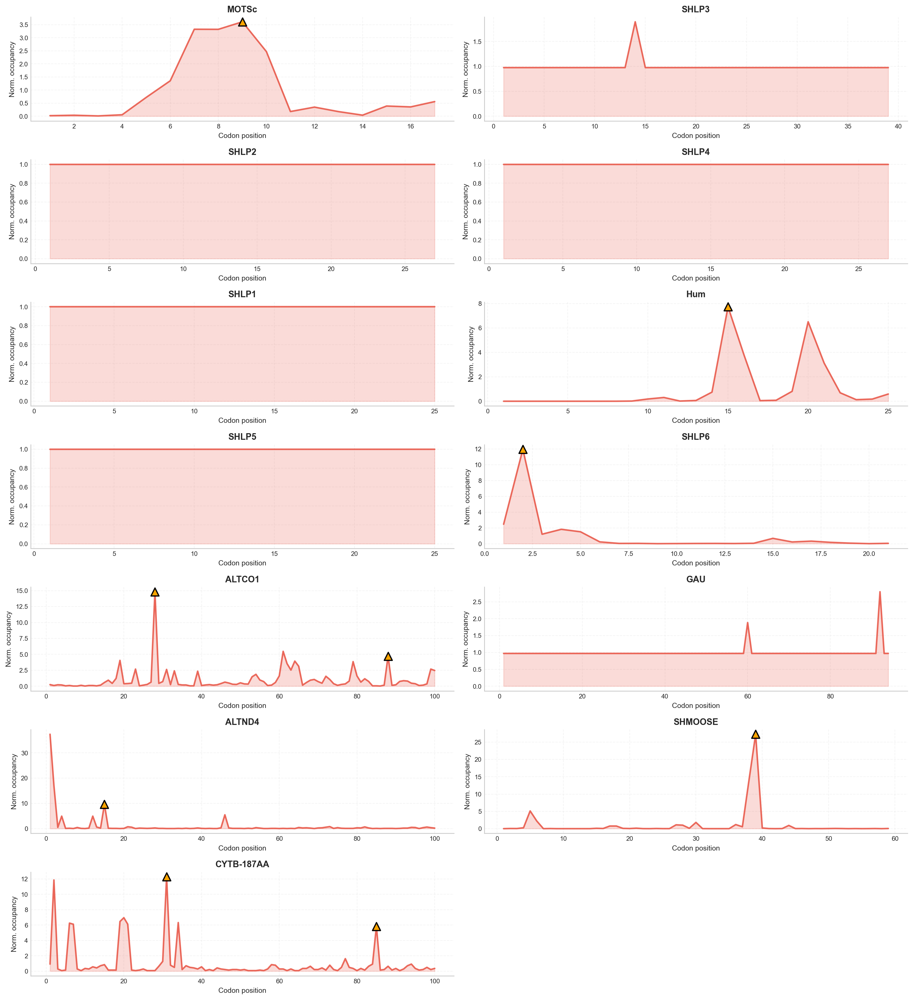

In [31]:
reload(mrae)
# Plot the initiation profile of all canonical genes
init_data_canonical = mrae.batch_initiation_analysis(df = df_init, gene_ids = canonical_genes, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_analysis_all_genes'), figsize_per_plot = (8,2.5), ncols = 2)
# Plot the initiation profile of all overlapping genes
init_data_overlapping = mrae.batch_initiation_analysis(df = df_init, gene_ids = overlapping_genes, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_analysis_all_overlapping_genes'), figsize_per_plot = (8,2.5), ncols = 2)

In [32]:
df_init

,transcript_id,gene_id,codon_seq,codon_index,codon_count_sum,sample,GeneSymbol,Class,Strand,RPM,RPM_normgene,RPM_cumsum,RPM_cumsum_normgene,transcript_class,cell_line
0,gene_MOTSc,gene_MOTSc,ATG,1,0,SAMN36415886_3_HS,NaN,NaN,NaN,1.000000,0.000001,1.000000,0.000001,Overlapping,HEK
1,gene_MOTSc,gene_MOTSc,AGG,2,0,SAMN36415886_3_HS,NaN,NaN,NaN,1.000000,0.000001,2.000000,0.000002,Overlapping,HEK
2,gene_MOTSc,gene_MOTSc,TGG,3,0,SAMN36415886_3_HS,NaN,NaN,NaN,1.000000,0.000001,3.000000,0.000003,Overlapping,HEK
3,gene_MOTSc,gene_MOTSc,CAA,4,0,SAMN36415886_3_HS,NaN,NaN,NaN,1.000000,0.000001,4.000000,0.000005,Overlapping,HEK
4,gene_MOTSc,gene_MOTSc,GAA,5,6,SAMN36415886_3_HS,NaN,NaN,NaN,911.885077,0.001046,915.885077,0.001051,Overlapping,HEK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14176,gene_CYTB-187AA,gene_CYTB-187AA,CTC,184,4,SAMN36415884_89_HS,NaN,NaN,NaN,8.605242,0.000010,889150.556633,0.999882,Overlapping,HEK
14177,gene_CYTB-187AA,gene_CYTB-187AA,CCA,185,11,SAMN36415884_89_HS,NaN,NaN,NaN,21.914416,0.000025,889172.471050,0.999907,Overlapping,HEK
14178,gene_CYTB-187AA,gene_CYTB-187AA,TTC,186,12,SAMN36415884_89_HS,NaN,NaN,NaN,23.815727,0.000027,889196.286777,0.999934,Overlapping,HEK
14179,gene_CYTB-187AA,gene_CYTB-187AA,CGA,187,11,SAMN36415884_89_HS,NaN,NaN,NaN,21.914416,0.000025,889218.201193,0.999958,Overlapping,HEK


Comparing 13 alternative genes to canonical metagene...
  Analyzing MT-ND1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\canonical_genes_validation_summary\MT-ND1_vs_canonical.jpg
Score: 0.969
  Analyzing MT-ND2... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\canonical_genes_validation_summary\MT-ND2_vs_canonical.jpg
Score: 0.483
  Analyzing MT-CO1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\canonical_genes_validation_summary\MT-CO1_vs_canonical.jpg
Score: 0.843
  Analyzing MT-CO2... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\canonical_genes_validation_summary\MT-CO2_vs_canonical.jpg
Score: 0.828
  Analyzing MT-ATP8... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\canonical_genes_validation_summary\MT-ATP8_vs_canonical.jpg
Score: 0.971
  

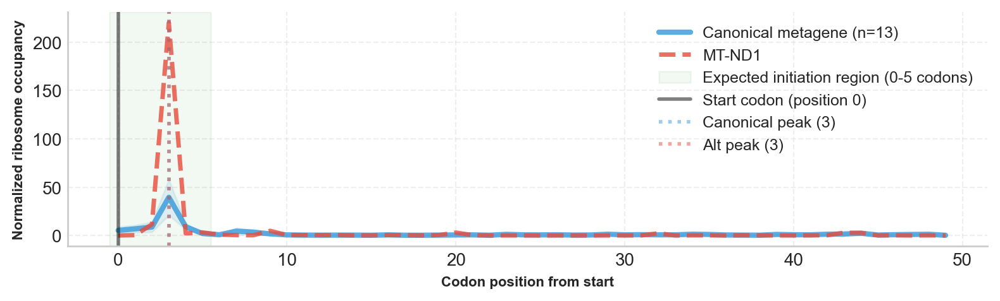

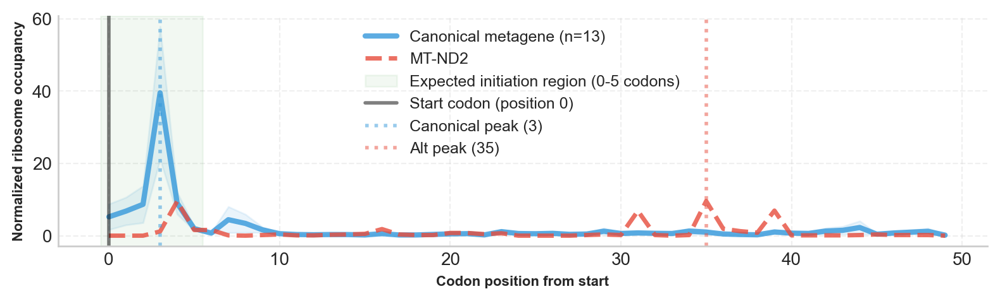

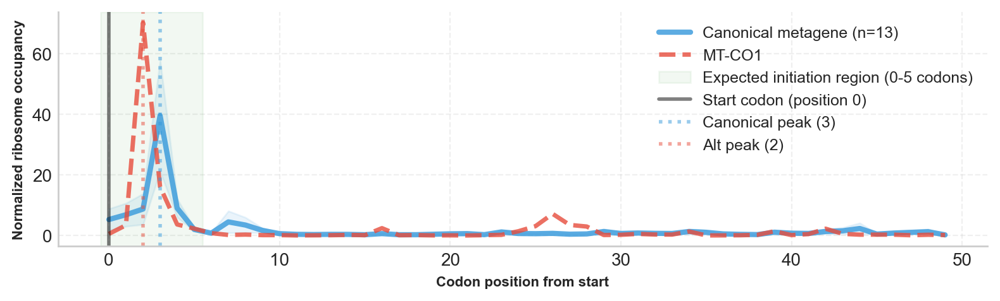

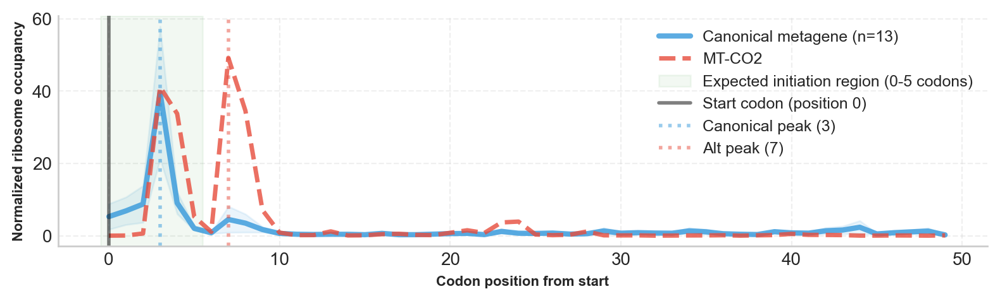

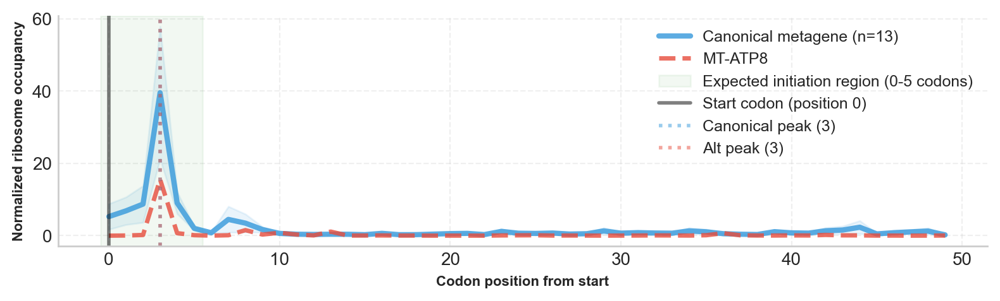

...

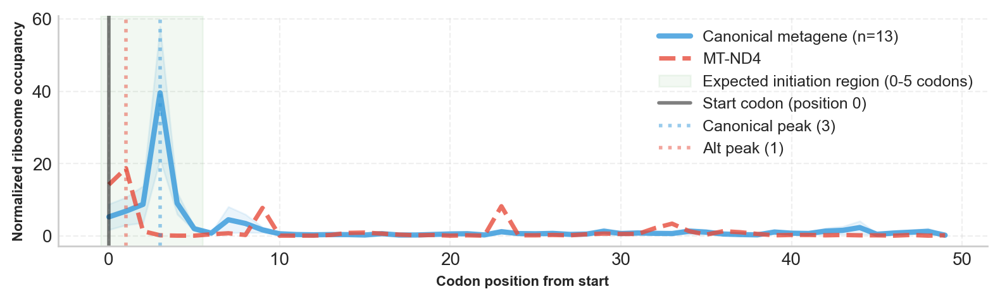

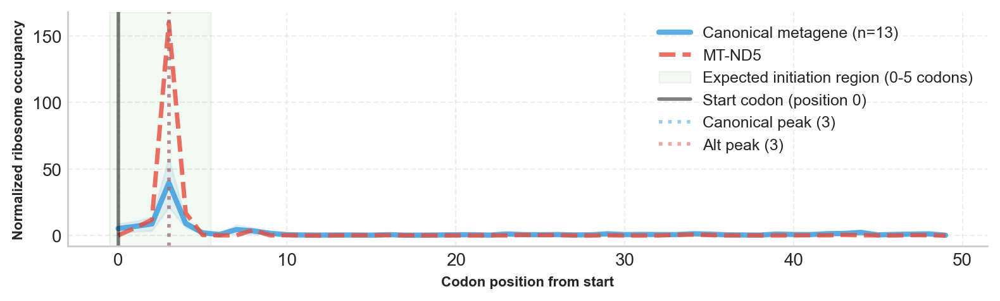

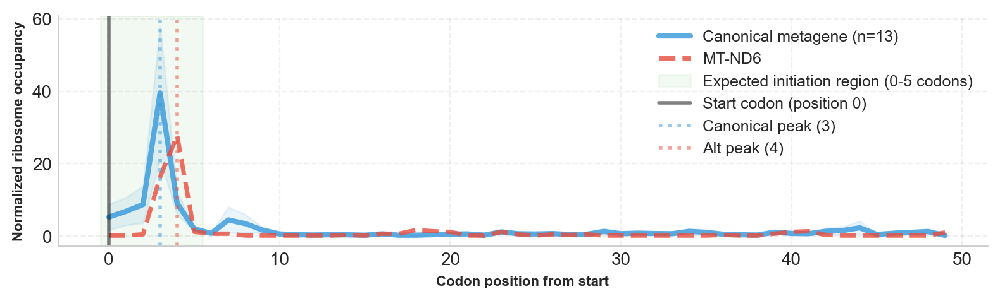

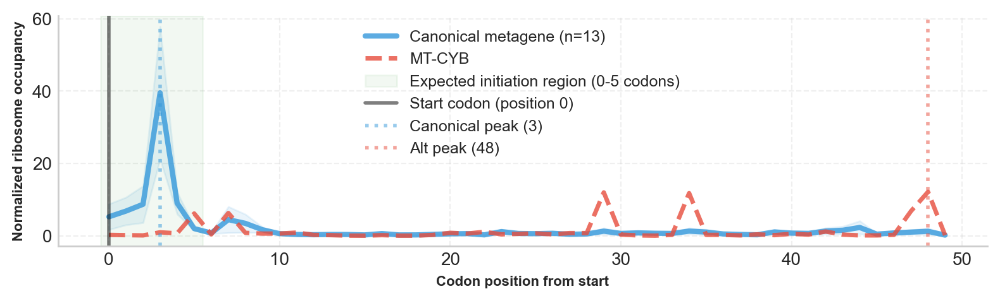

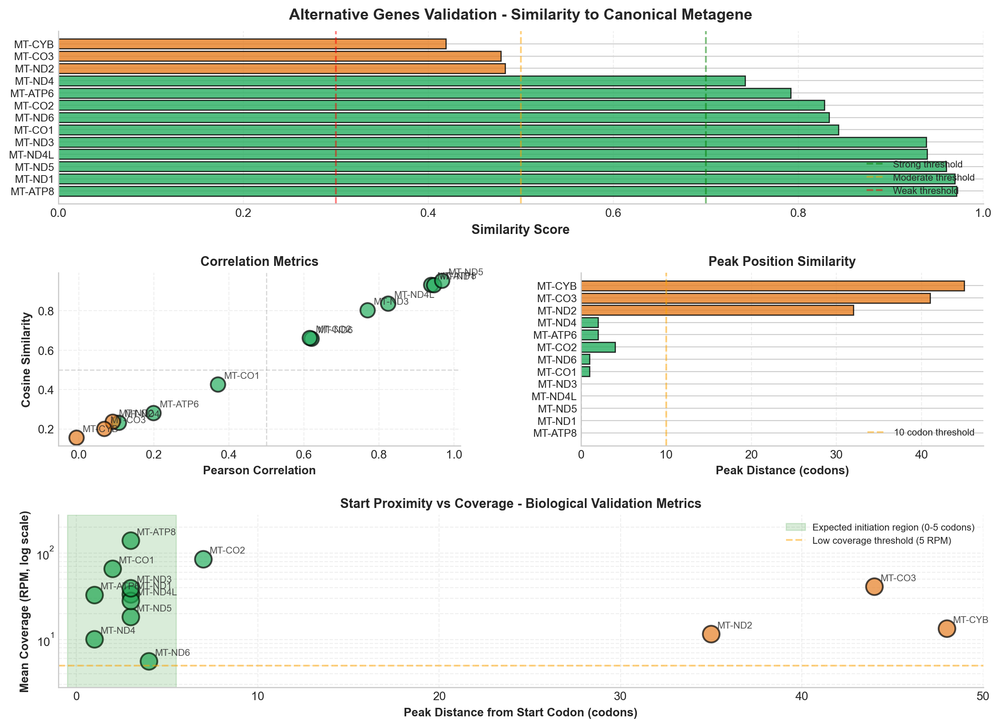

In [34]:
# As a confirmation, calculate the similarity scores for all canonical genes
similarity_results_canonical, summary_fig_canonical = mrae.batch_compare_to_canonical(df = df_init, alternative_gene_ids = canonical_genes, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'canonical_genes_validation_summary'),  plot_individual = True, indiv_figsize = (8,2.5), plot_metrics = False)

Comparing 13 alternative genes to canonical metagene...
  Analyzing gene_MOTSc... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes\MOTSc_vs_canonical.jpg
Score: 0.604
  Analyzing gene_SHLP3... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes\SHLP3_vs_canonical.jpg
Score: 0.490
  Analyzing gene_SHLP2... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes\SHLP2_vs_canonical.jpg
Score: 0.687
  Analyzing gene_SHLP4... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes\SHLP4_vs_canonical.jpg
Score: 0.687
  Analyzing gene_SHLP1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_al

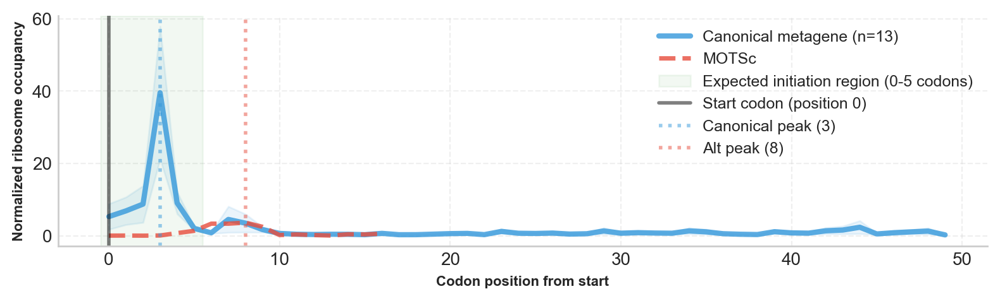

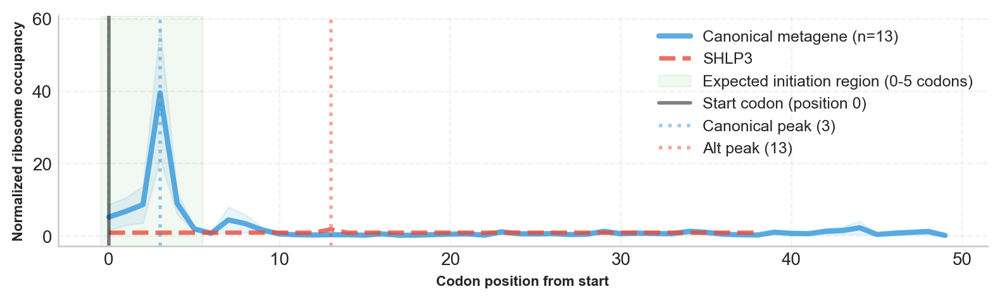

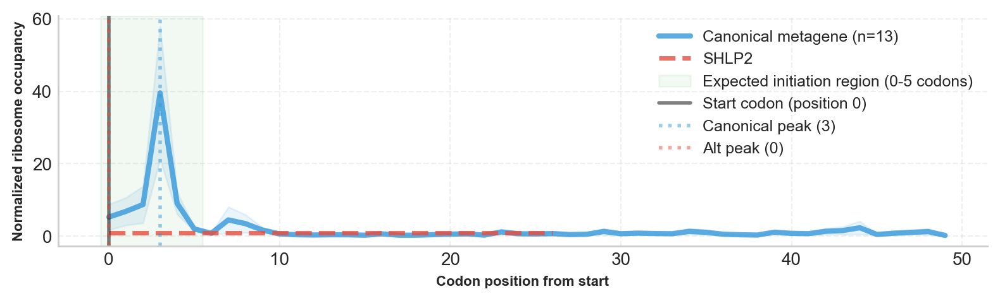

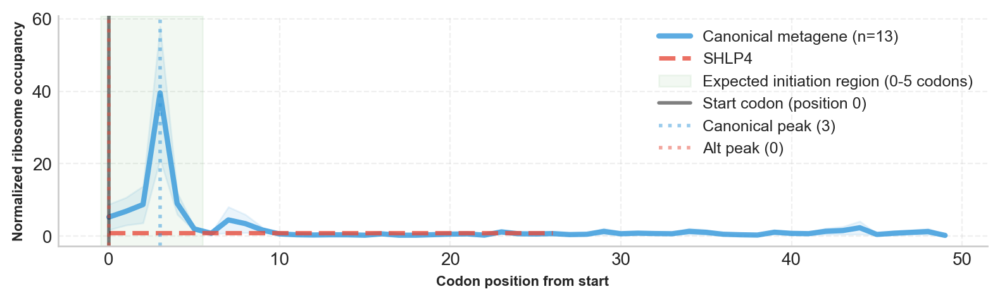

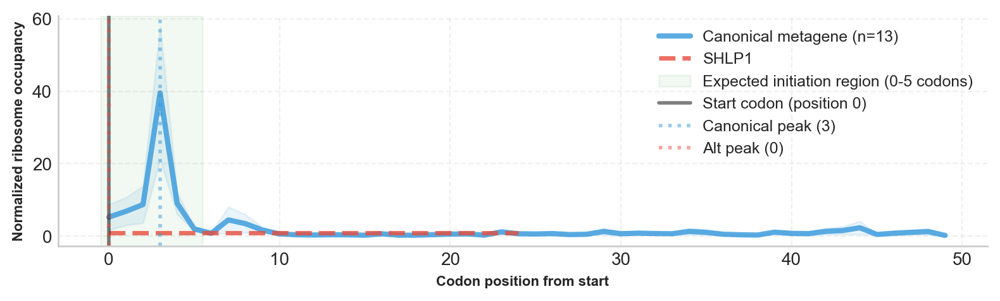

...

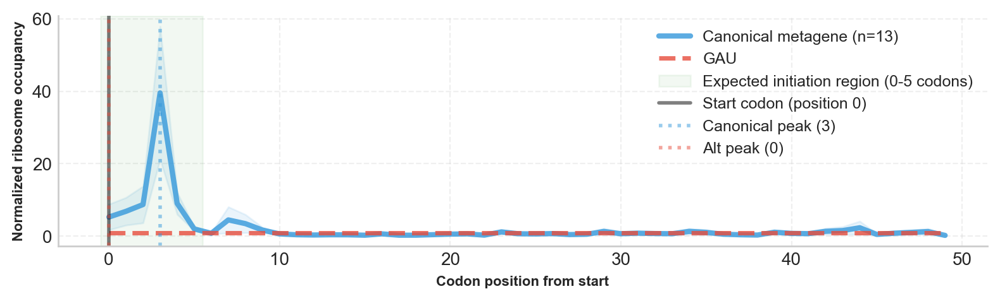

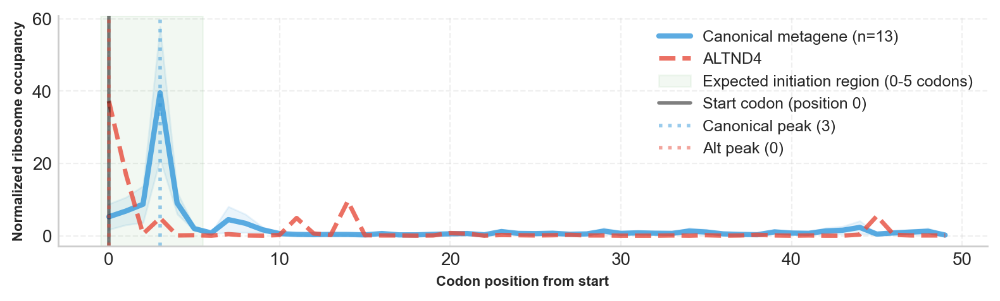

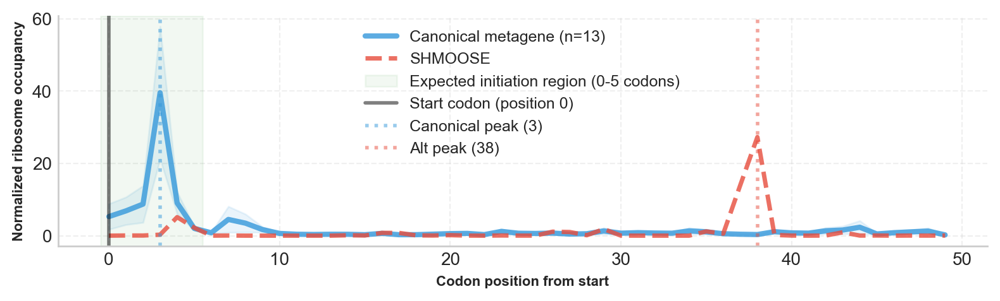

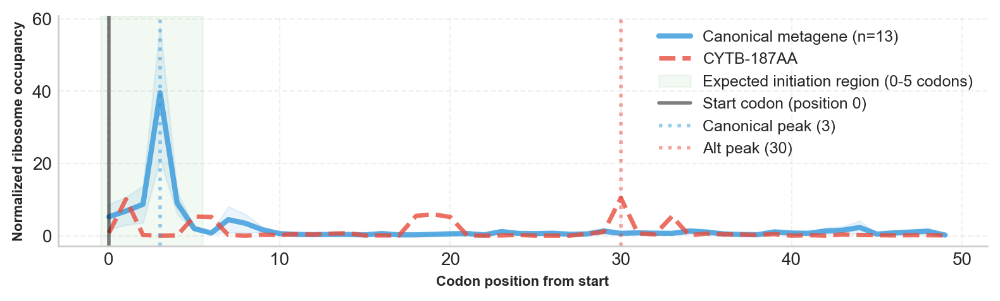

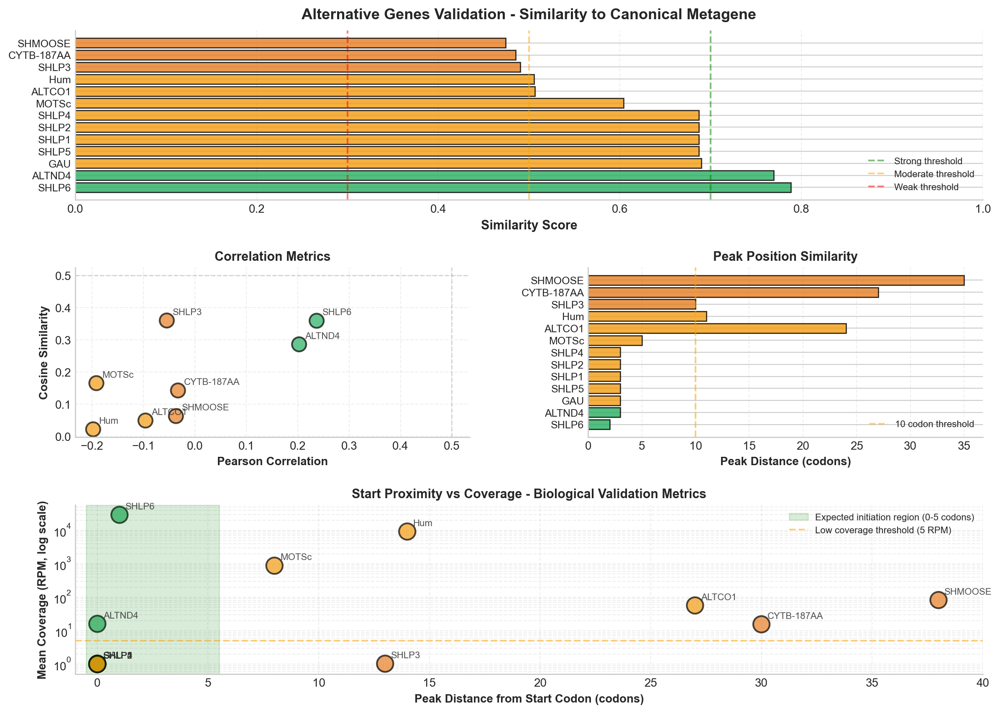

In [9]:
reload(mrae)
# Batch compare all overlapping genes to the expected initiation profile based on the canonical gene metaprofile
results_df_init, summary_fig = mrae.batch_compare_to_canonical(df_init, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_comparison_all_overlapping_genes'), plot_summary = True, plot_individual=True, indiv_figsize = (8,2.5), plot_metrics = False)

Comparing 13 alternative genes to canonical metagene...
  Analyzing gene_MOTSc... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes_mito_settings\MOTSc_vs_canonical.pdf
Score: 0.548
  Analyzing gene_SHLP3... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes_mito_settings\SHLP3_vs_canonical.pdf
Score: 0.495
  Analyzing gene_SHLP2... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes_mito_settings\SHLP2_vs_canonical.pdf
Score: 0.618
  Analyzing gene_SHLP4... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_all_overlapping_genes_mito_settings\SHLP4_vs_canonical.pdf
Score: 0.390
  Analyzing gene_SHLP1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_rev

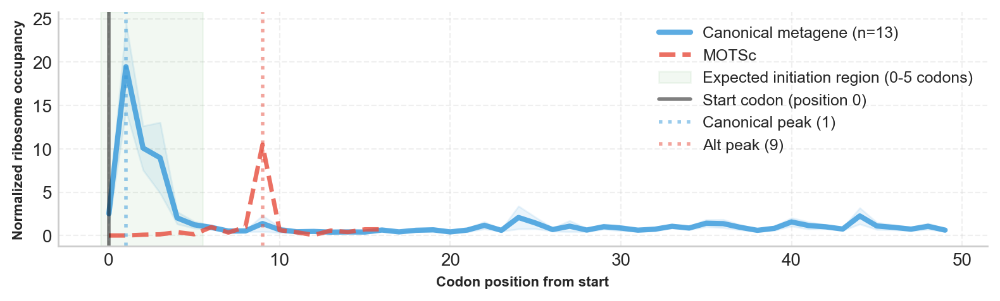

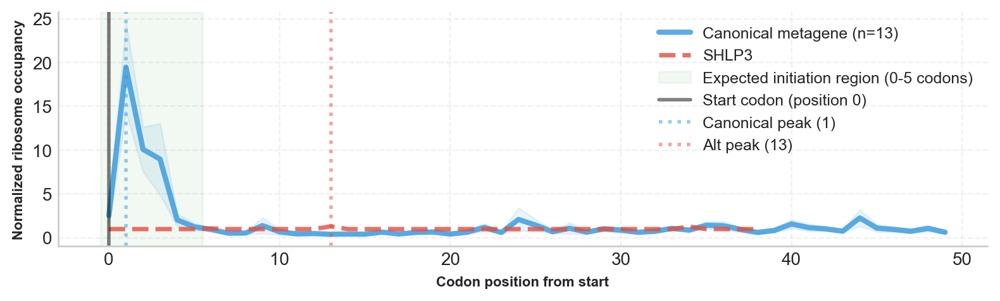

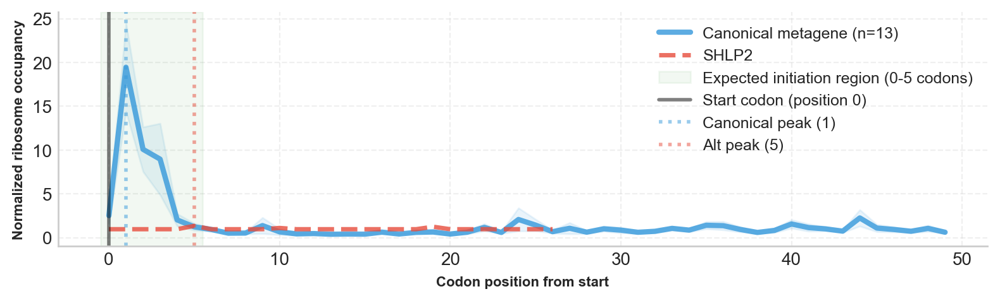

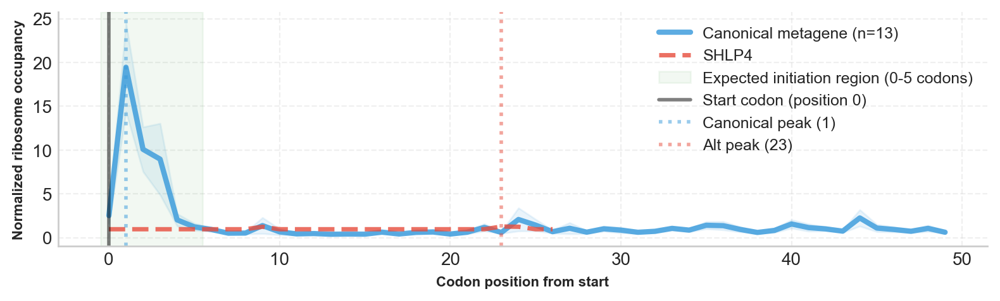

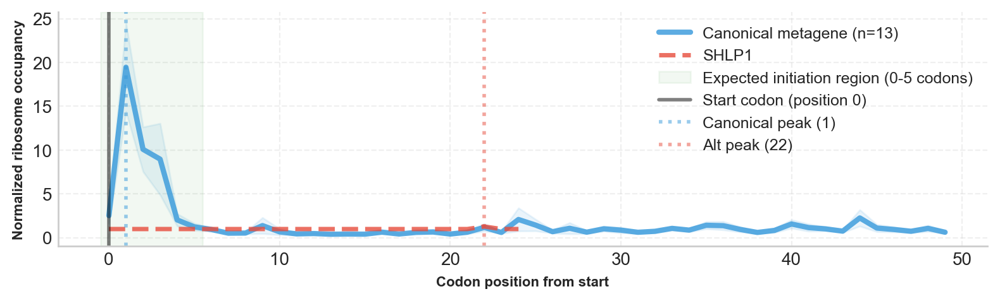

...

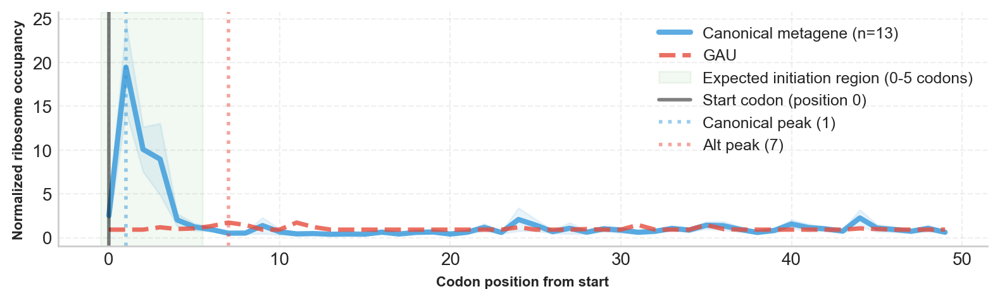

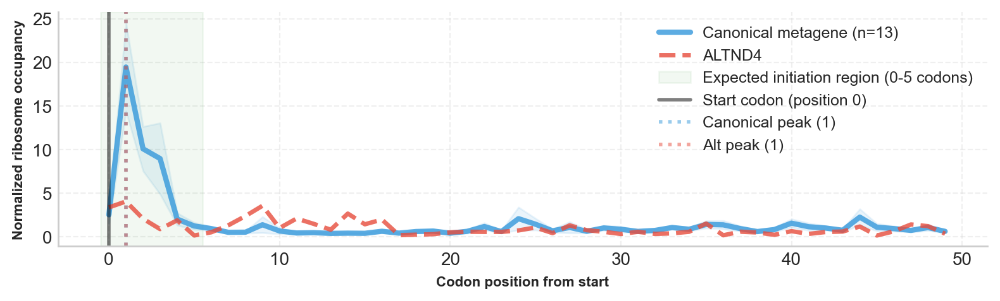

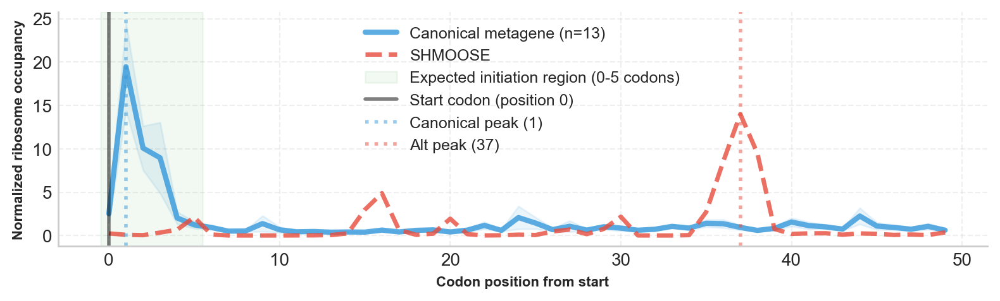

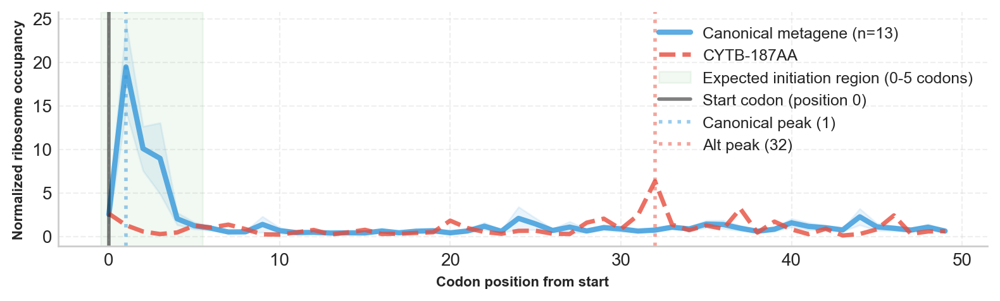

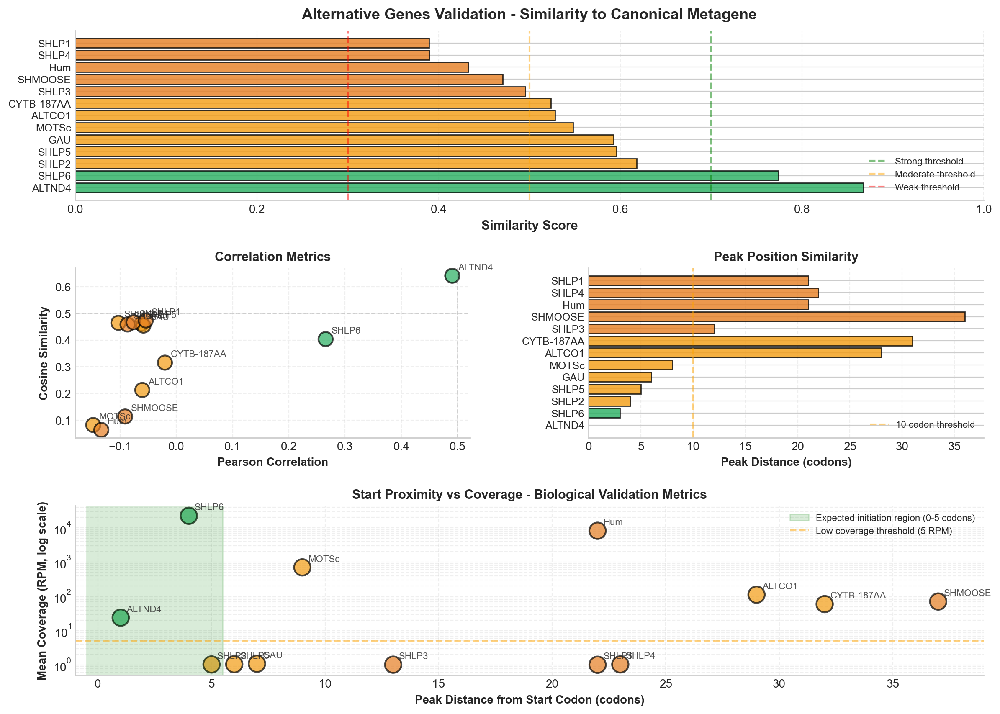

In [17]:
reload(mrae)
# Batch compare all overlapping genes to the expected initiation profile based on the canonical gene metaprofile
results_df_init_mito_settings, summary_fig = mrae.batch_compare_to_canonical(df_init_mito_settings, output_dir = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_comparison_all_overlapping_genes_mito_settings'), plot_summary = True, plot_individual=True, indiv_figsize = (8,2.5), plot_metrics = False)

In [28]:
results_df_init

,gene_id,gene_name,similarity_score,pearson_r,pearson_p,spearman_r,spearman_p,cosine_similarity,peak_position_canonical,peak_position_alternative,...,peak_height_ratio,peak_distance_from_start_canonical,peak_distance_from_start_alternative,start_proximity_score,coverage_alternative,coverage_canonical_mean,coverage_ratio,coverage_adequacy_score,interpretation,n_canonical_genes
0,gene_SHLP6,SHLP6,0.788708,0.236827,0.301314,0.392208,0.078660,0.359073,3,1,...,0.302406,3,1,1.000000,28953.456442,40.165352,720.856517,0.850000,STRONG evidence of canonical-like initiation s...,13
1,gene_ALTND4,ALTND4,0.769825,0.202741,0.157937,0.024530,0.865722,0.285975,3,0,...,0.942357,3,0,1.000000,15.941514,40.165352,0.396897,0.791604,STRONG evidence of canonical-like initiation s...,13
2,gene_GAU,GAU,0.689810,NaN,NaN,NaN,NaN,0.364801,3,0,...,0.024540,3,0,1.000000,1.030340,40.165352,0.025652,0.144248,MODERATE evidence of canonical-like initiation...,13
3,gene_MOTSc,MOTSc,0.604266,-0.191764,0.460925,-0.098039,0.708151,0.165598,3,8,...,0.091341,3,8,0.750000,871.526275,40.165352,21.698459,0.850000,MODERATE evidence of canonical-like initiation...,13
4,gene_ALTCO1,ALTCO1,0.506372,-0.096272,0.506003,-0.456855,0.000853,0.049609,3,27,...,0.222986,3,27,0.527403,56.515796,40.165352,1.407078,0.961951,MODERATE evidence of canonical-like initiation...,13
5,gene_Hum,Hum,0.505748,-0.198028,0.342675,-0.739917,0.000024,0.022405,3,14,...,0.195465,3,14,0.600548,9160.220481,40.165352,228.062741,0.850000,MODERATE evidence of canonical-like initiation...,13
6,gene_CYTB-187AA,CYTB-187AA,0.485316,-0.032956,0.820266,-0.014486,0.920465,0.142851,3,30,...,0.265715,3,30,0.520300,15.445862,40.165352,0.384557,0.784921,WEAK evidence of canonical-like initiation sig...,13
7,gene_SHMOOSE,SHMOOSE,0.474232,-0.036951,0.798905,-0.025542,0.860239,0.063448,3,38,...,0.689797,3,38,0.509122,81.982419,40.165352,2.041123,0.982178,WEAK evidence of canonical-like initiation sig...,13


Comparing 8 alternative genes to canonical metagene...
  Analyzing gene_MOTSc... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_if3_ko_mitoriboseq\initiation_comparison_all_overlapping_genes\MOTSc_vs_canonical.pdf
Score: 0.686
  Analyzing gene_Hum... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_if3_ko_mitoriboseq\initiation_comparison_all_overlapping_genes\Hum_vs_canonical.pdf
Score: 0.505
  Analyzing gene_SHLP6... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_if3_ko_mitoriboseq\initiation_comparison_all_overlapping_genes\SHLP6_vs_canonical.pdf
Score: 0.813
  Analyzing gene_ALTCO1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_if3_ko_mitoriboseq\initiation_comparison_all_overlapping_genes\ALTCO1_vs_canonical.pdf
Score: 0.513
  Analyzing gene_GAU... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_if3_ko_mitori

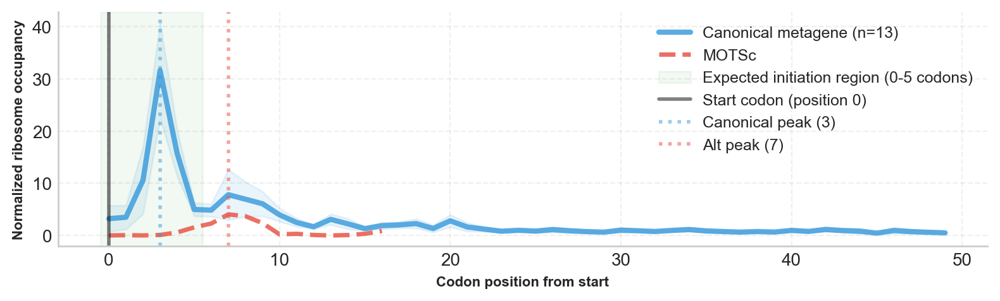

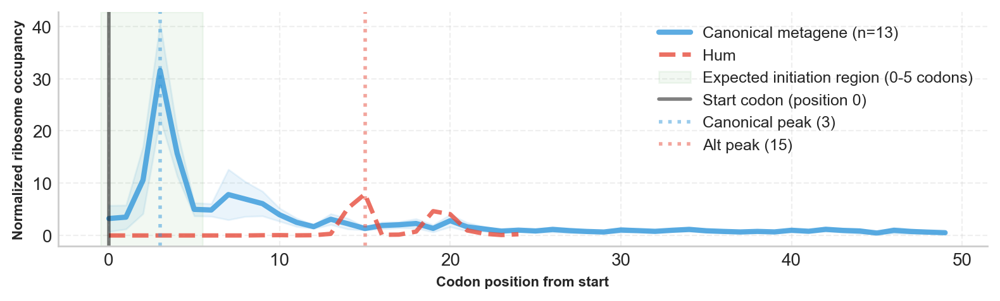

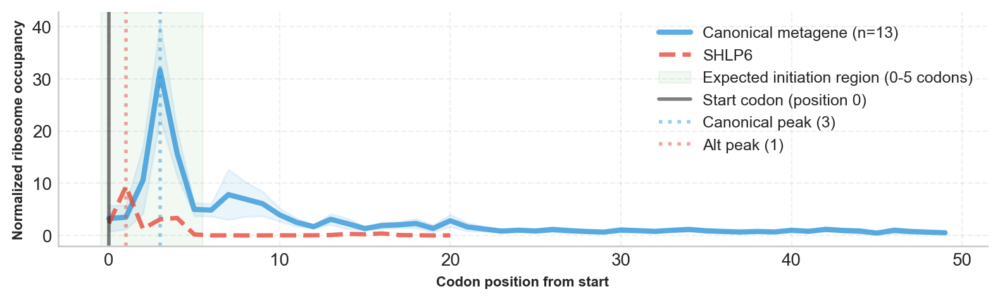

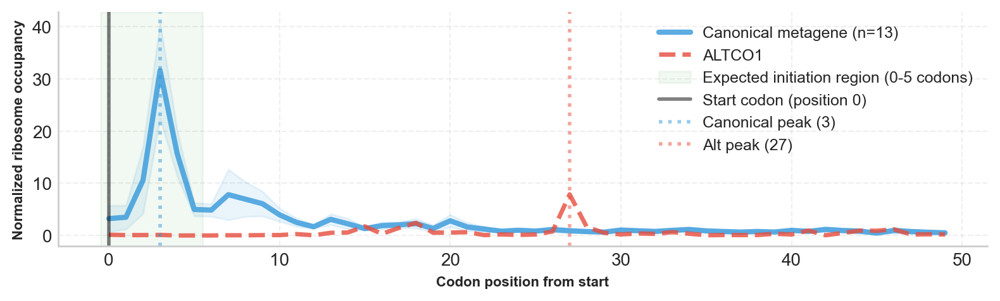

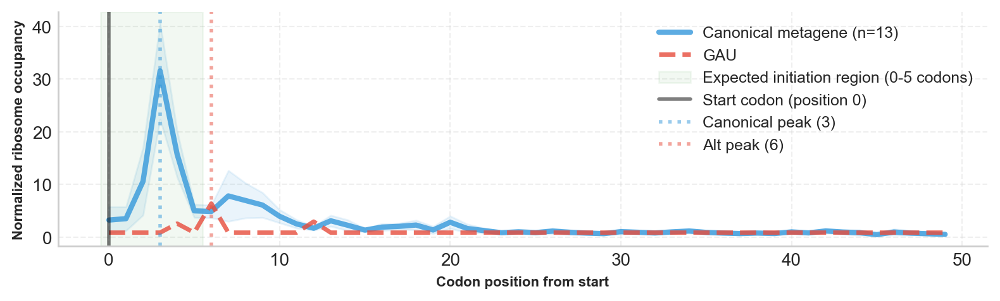

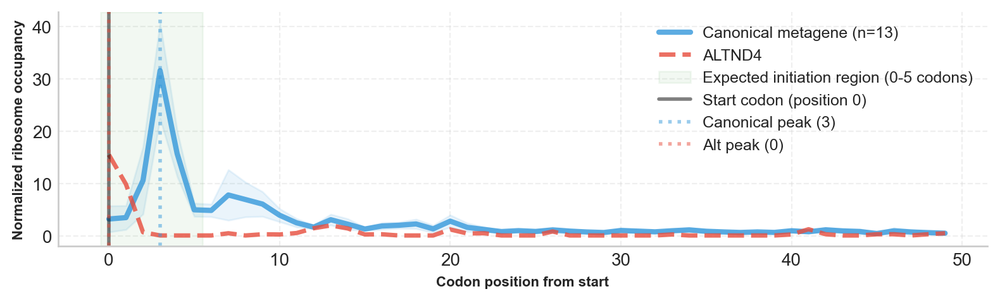

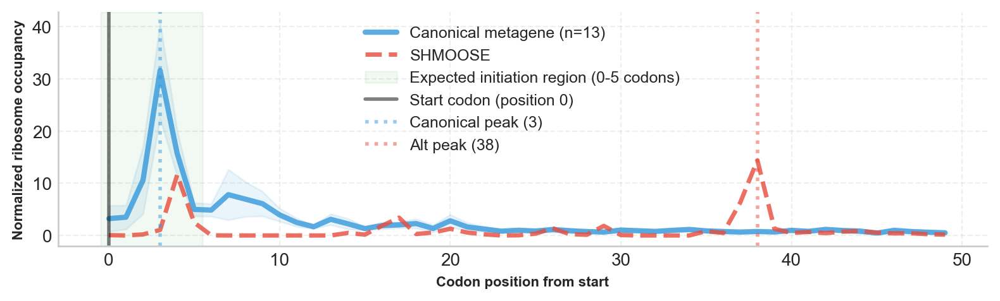

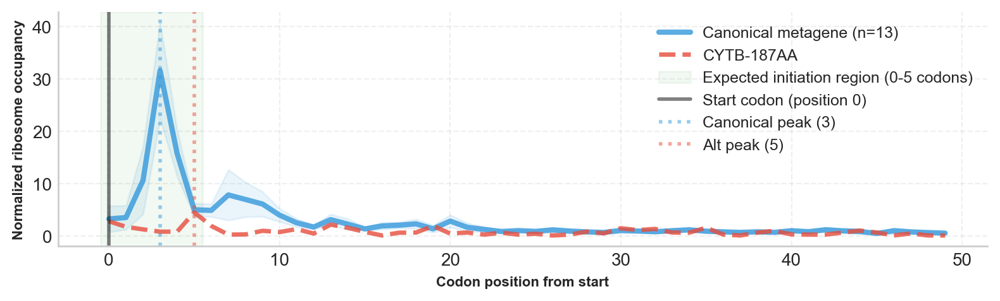

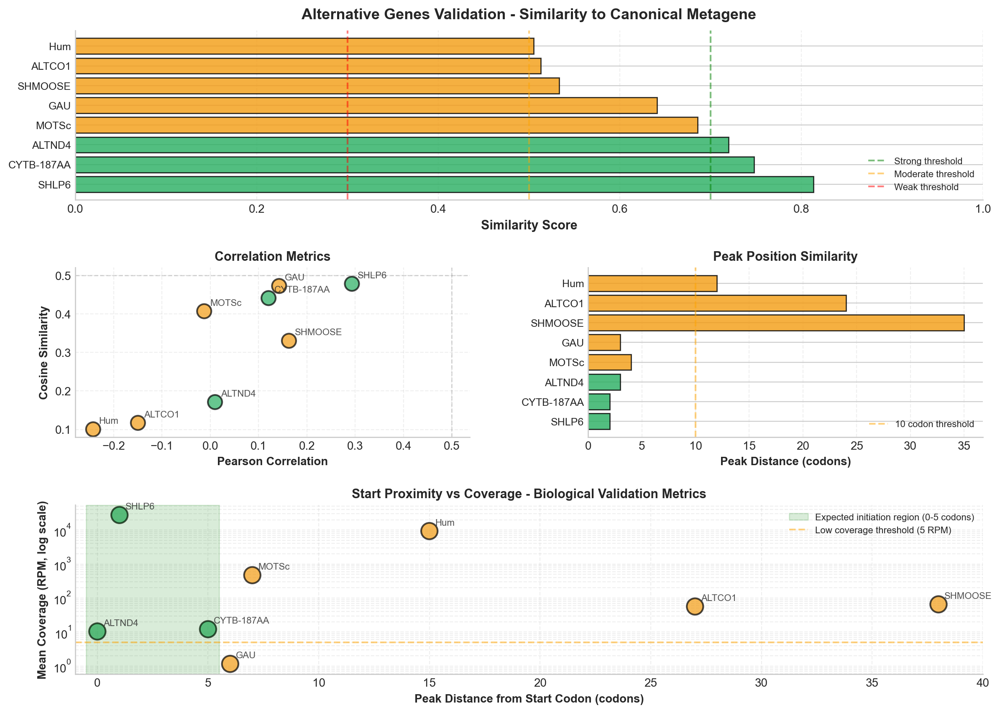

In [34]:
reload(mrae)
# Batch compare all overlapping genes to the expected initiation profile based on the canonical gene metaprofile
results_df_ini_if3, summary_fig = mrae.batch_compare_to_canonical(df_init_if3, output_dir = os.path.join(PATH, 'figures', 'hek_ini_if3_ko_mitoriboseq', 'initiation_comparison_all_overlapping_genes'), plot_summary = True, plot_individual=True, indiv_figsize = (8,2.5), plot_metrics = False)

Comparing 8 alternative genes to canonical metagene...
  Analyzing gene_MOTSc... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hct_mitoriboseq\initiation_comparison_all_overlapping_genes\MOTSc_vs_canonical.pdf
Score: 0.597
  Analyzing gene_Hum... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hct_mitoriboseq\initiation_comparison_all_overlapping_genes\Hum_vs_canonical.pdf
Score: 0.501
  Analyzing gene_SHLP6... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hct_mitoriboseq\initiation_comparison_all_overlapping_genes\SHLP6_vs_canonical.pdf
Score: 0.625
  Analyzing gene_ALTCO1... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hct_mitoriboseq\initiation_comparison_all_overlapping_genes\ALTCO1_vs_canonical.pdf
Score: 0.493
  Analyzing gene_GAU... Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hct_mitoriboseq\initiation_comparison_all_overlapping_genes\GAU_v

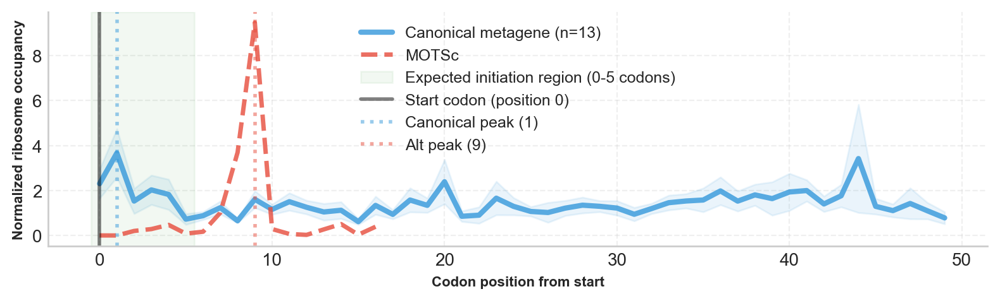

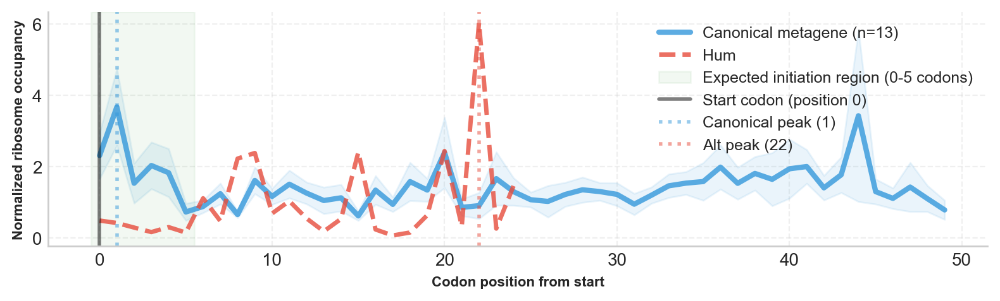

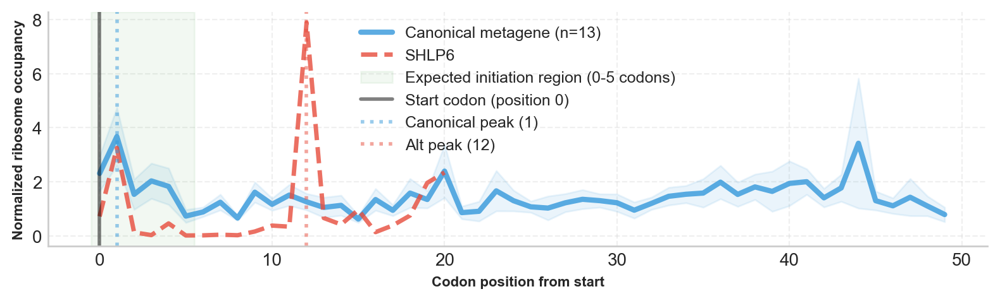

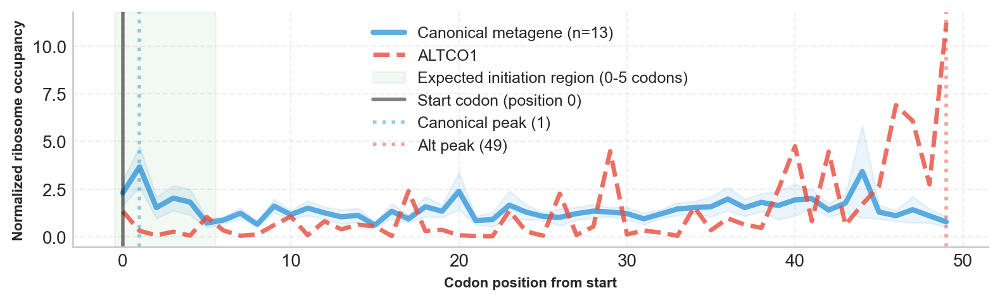

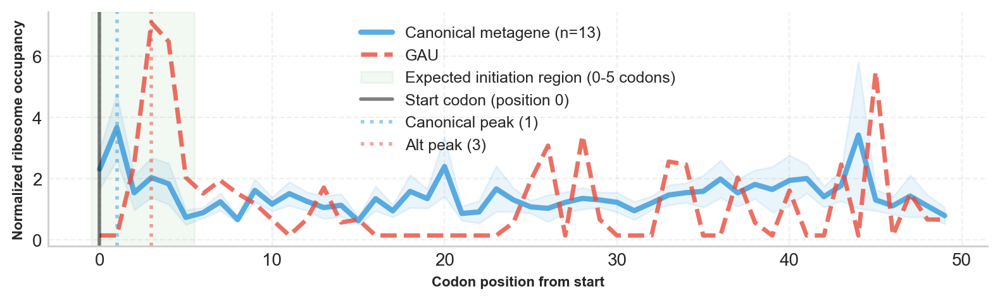

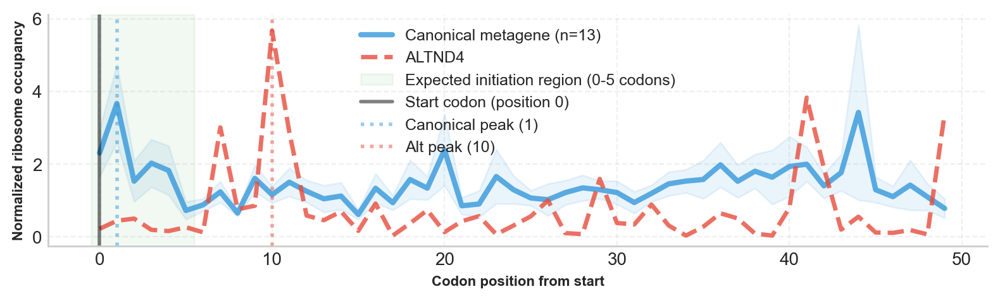

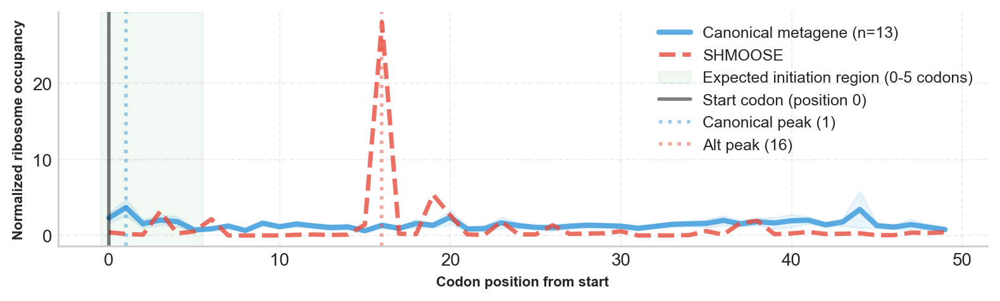

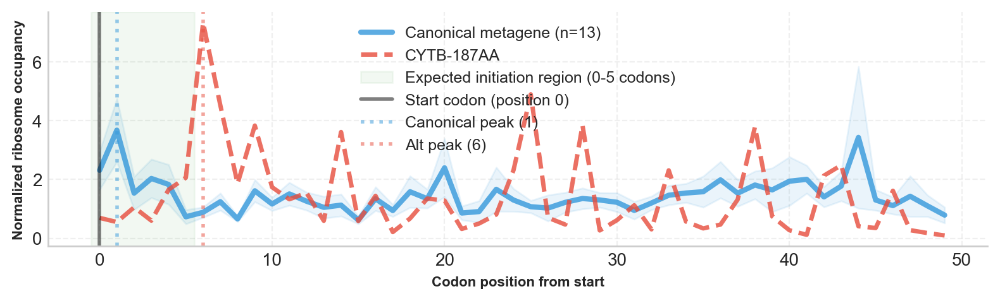

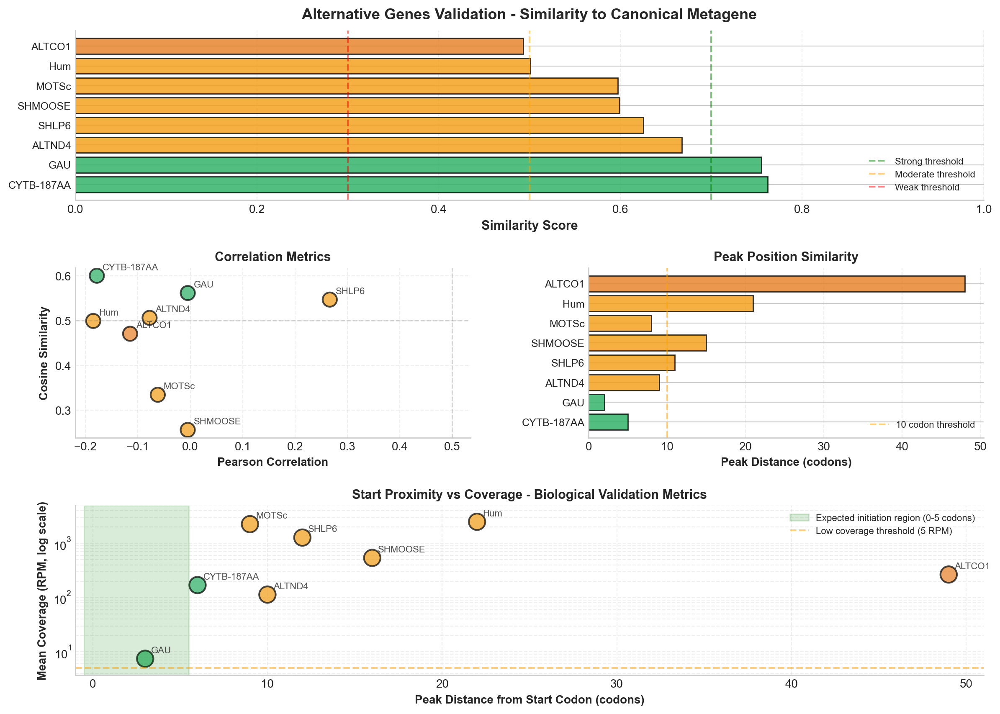

In [33]:
reload(mrae)
# Batch compare all overlapping genes to the expected initiation profile based on the canonical gene metaprofile
results_df_hct, summary_fig = mrae.batch_compare_to_canonical(df, output_dir = os.path.join(PATH, 'figures', 'hct_mitoriboseq', 'initiation_comparison_all_overlapping_genes'), plot_summary = True, plot_individual=True, indiv_figsize = (8,2.5), plot_metrics = False)

In [61]:
results_df_init

,gene_id,gene_name,similarity_score,pearson_r,pearson_p,spearman_r,spearman_p,cosine_similarity,peak_position_canonical,peak_position_alternative,peak_distance,peak_height_ratio,interpretation,n_canonical_genes
0,gene_GAU,GAU,0.656854,NaN,NaN,NaN,NaN,0.373709,3,0,3,0.025691,MODERATE evidence of canonical-like initiation...,13
1,gene_SHLP5,SHLP5,0.652716,NaN,NaN,NaN,NaN,0.425433,3,0,3,0.026463,MODERATE evidence of canonical-like initiation...,13
2,gene_SHLP1,SHLP1,0.652716,NaN,NaN,NaN,NaN,0.425433,3,0,3,0.026463,MODERATE evidence of canonical-like initiation...,13
3,gene_SHLP4,SHLP4,0.652259,NaN,NaN,NaN,NaN,0.415629,3,0,3,0.026463,MODERATE evidence of canonical-like initiation...,13
4,gene_SHLP2,SHLP2,0.652259,NaN,NaN,NaN,NaN,0.415629,3,0,3,0.026463,MODERATE evidence of canonical-like initiation...,13
5,gene_SHLP6,SHLP6,0.631606,0.244598,0.285254,0.396104,0.075476,0.367756,3,1,2,0.316401,MODERATE evidence of canonical-like initiation...,13
6,gene_ALTND4,ALTND4,0.611672,0.206991,0.149217,0.022274,0.877977,0.291521,3,0,3,0.989245,MODERATE evidence of canonical-like initiation...,13
7,gene_SHLP3,SHLP3,0.528233,-0.055138,0.738842,-0.158551,0.335019,0.368679,3,13,10,0.050155,MODERATE evidence of canonical-like initiation...,13
8,gene_MOTSc,MOTSc,0.426843,-0.192502,0.459169,-0.107843,0.680350,0.170896,3,8,5,0.095546,WEAK evidence of canonical-like initiation sig...,13
9,gene_CYTB-187AA,CYTB-187AA,0.364799,-0.029697,0.837786,-0.013955,0.923372,0.149246,3,30,27,0.280106,WEAK evidence of canonical-like initiation sig...,13


Saved comparison to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\initiation_comparison_shlp6.jpg


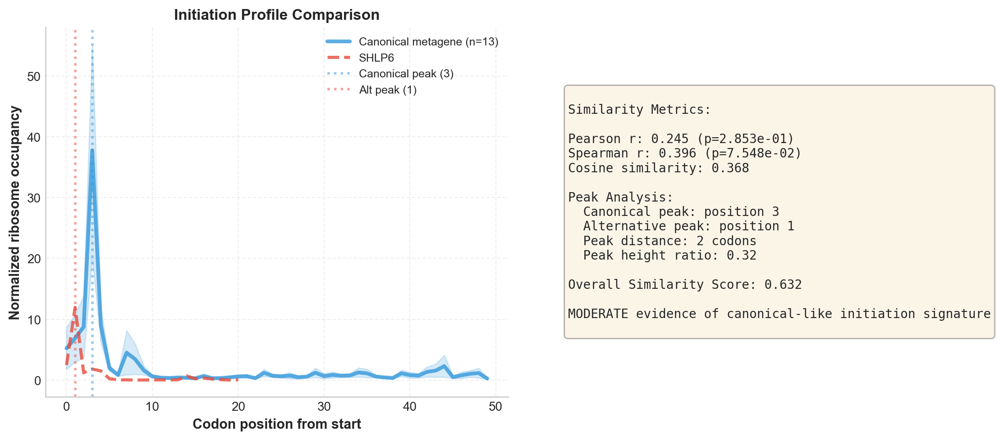

In [44]:
reload(mrae)
# Compare each overlapping gene to the expected initiation profile based on the canonical gene metaprofile
init_shlp6_comparison = mrae.compare_to_canonical_metagene(df_init, alternative_gene_id='gene_SHLP6', canonical_gene_ids=canonical_genes, save_path = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'initiation_comparison_shlp6.jpg'), plot = True, )

Saved to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\metagene_initiation_canonical.png
Saved to c:\Users\shtolz\Desktop\multi_function_review\figures\hek_ini_mitoriboseq\metagene_initiation_overlapping.png


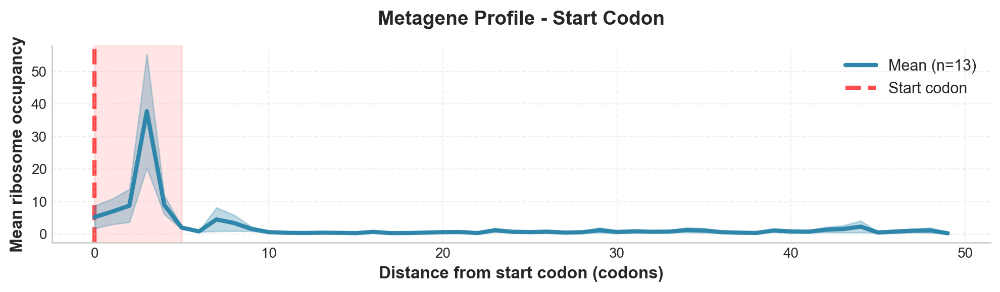

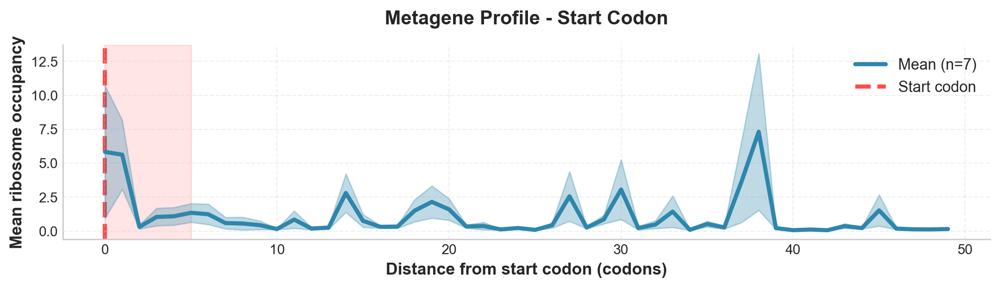

In [ ]:
# Plot meta-gene initiation
reload(mrae)

mrae.plot_metagene_initiation(df_init, gene_ids = canonical_genes, save_path = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'metagene_initiation_canonical.png'), align_to='start', figsize = (10,3))
mrae.plot_metagene_initiation(df_init, gene_ids = overlapping_genes, save_path = os.path.join(PATH, 'figures', 'hek_ini_mitoriboseq', 'metagene_initiation_overlapping.png'), align_to='start', figsize = (10,3))
pass

In [ ]:
# Plot bi-cistronic initiation


In [ ]:
reload(mra)
# ============================================================================
# INITIATION METRICS
# ============================================================================

# Calculate initiation metrics (first 30 codons)
metrics = mra.calculate_initiation_metrics(df, window_size=30)

print("\n" + "="*70)
print("INITIATION METRICS (window_size=30)")
print("="*70)

metrics_summary = metrics.groupby('transcript_class').agg({
    'peak_position': ['mean', 'std', 'median'],
    'peak_rpm': ['mean', 'std'],
    'initiation_slope': ['mean', 'std', 'median']
})
display(metrics_summary)

# Statistical test for peak position
from scipy import stats as scipy_stats

overlap_peaks = metrics[metrics['transcript_class'] == 'Overlapping']['peak_position']
canonical_peaks = metrics[metrics['transcript_class'] == 'Canonical']['peak_position']

t_stat, p_val = scipy_stats.ttest_ind(overlap_peaks, canonical_peaks)
print(f"\nPeak position t-test: t = {t_stat:.3f}, p = {p_val:.3e}")

u_stat, p_val_u = scipy_stats.mannwhitneyu(overlap_peaks, canonical_peaks)
print(f"Peak position Mann-Whitney U: U = {u_stat:.1f}, p = {p_val_u:.3e}")



INITIATION METRICS (window_size=30)


peak_position                   peak_rpm            \
                          mean       std median      mean       std   
transcript_class                                                      
Canonical            12.615385  9.055725   12.5  0.028978  0.012934   
Overlapping          14.437500  8.245959   12.0  0.028299  0.029974   

                 initiation_slope                      
                             mean       std    median  
transcript_class                                       
Canonical                0.005743  0.003120  0.005164  
Overlapping              0.003750  0.004256  0.002455


Peak position t-test: t = 0.655, p = 5.165e-01
Peak position Mann-Whitney U: U = 236.0, p = 4.753e-01


In [ ]:
df[df['gene_id'] == 'MT-ATP6']

,transcript_id,gene_id,codon_seq,codon_index,codon_count_sum,sample,GeneSymbol,Class,Strand,RPM,RPM_normgene,RPM_cumsum,RPM_cumsum_normgene,transcript_class,cell_line,position_1_count,position_2_count,position_3_count,method
1895,ENST00000361899,MT-ATP6,ATG,1,49,SAMN13331086_3_HS,MT-ATP6,protein_coding,+,381.925727,0.005533,381.925727,0.005533,Canonical,HCT_116,40.0,2.0,7.0,mito_riboseq
1896,ENST00000361899,MT-ATP6,AAC,2,256,SAMN13331086_3_HS,MT-ATP6,protein_coding,+,1991.142575,0.028846,2373.068302,0.034379,Canonical,HCT_116,18.0,192.0,46.0,mito_riboseq
1897,ENST00000361899,MT-ATP6,GAA,3,34,SAMN13331086_3_HS,MT-ATP6,protein_coding,+,265.315811,0.003844,2638.384113,0.038223,Canonical,HCT_116,23.0,0.0,11.0,mito_riboseq
1898,ENST00000361899,MT-ATP6,AAT,4,28,SAMN13331086_3_HS,MT-ATP6,protein_coding,+,218.671844,0.003168,2857.055957,0.041391,Canonical,HCT_116,9.0,1.0,18.0,mito_riboseq
1899,ENST00000361899,MT-ATP6,CTG,5,21,SAMN13331086_3_HS,MT-ATP6,protein_coding,+,164.253883,0.002380,3021.309840,0.043770,Canonical,HCT_116,20.0,1.0,0.0,mito_riboseq
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6683,ENST00000361899,MT-ATP6,CAC,223,42,SAMN13331085_1_HS,MT-ATP6,protein_coding,+,267.289634,0.004246,61995.854942,0.984928,Canonical,HCT_116,1.0,3.0,38.0,mito_riboseq
6684,ENST00000361899,MT-ATP6,GAC,224,20,SAMN13331085_1_HS,MT-ATP6,protein_coding,+,127.804588,0.002030,62123.659530,0.986959,Canonical,HCT_116,3.0,1.0,16.0,mito_riboseq
6685,ENST00000361899,MT-ATP6,AAC,225,31,SAMN13331085_1_HS,MT-ATP6,protein_coding,+,197.547111,0.003138,62321.206641,0.990097,Canonical,HCT_116,21.0,3.0,7.0,mito_riboseq
6686,ENST00000361899,MT-ATP6,ACA,226,70,SAMN13331085_1_HS,MT-ATP6,protein_coding,+,444.816057,0.007067,62766.022698,0.997164,Canonical,HCT_116,60.0,8.0,2.0,mito_riboseq



PLOTTING EXAMPLE TRANSCRIPTS


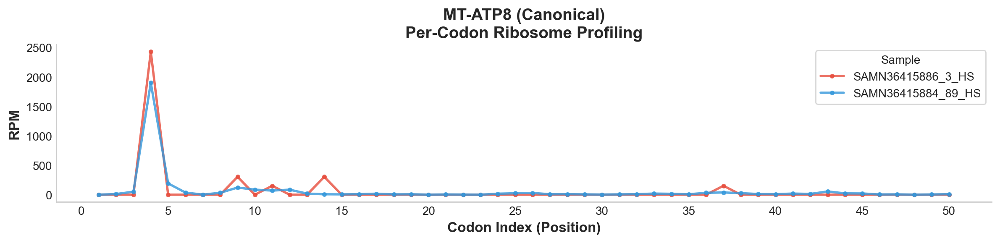

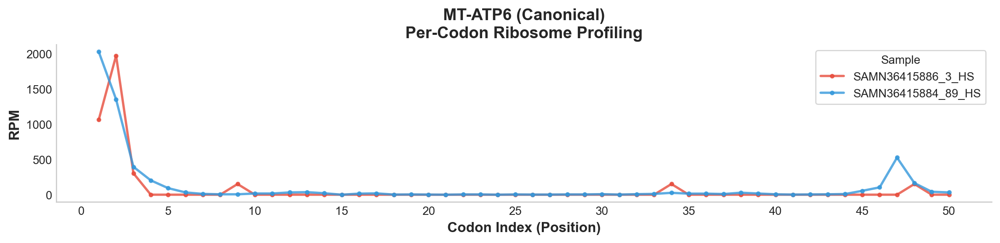

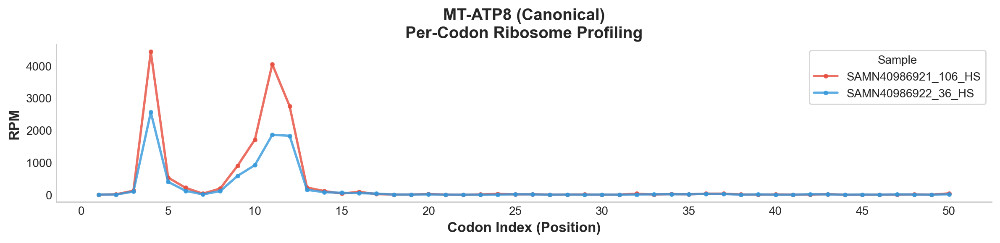

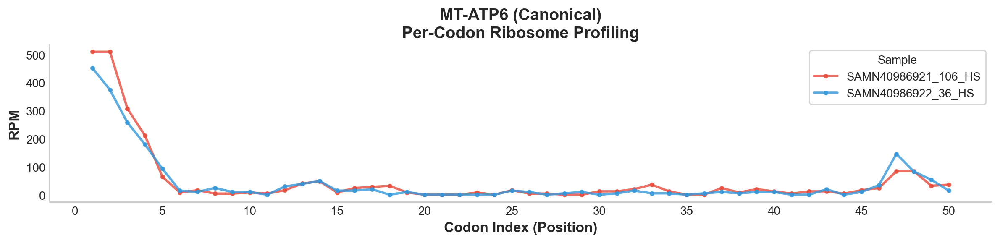

In [ ]:
reload(mra)
# ============================================================================
# EXAMPLE TRANSCRIPT PLOTS
# ============================================================================

# Plot a representative overlapping gene
print("\n" + "="*70)
print("PLOTTING EXAMPLE TRANSCRIPTS")
print("="*70)

fig1 = mra.plot_per_codon_profile(
    df_init, 
    'ENST00000361851',
    figsize=(12, 3),
    show_window = 50,
    colors=['#E74C3C', '#3498DB', 'green'],
    
)
plt.show()

# Plot a representative canonical gene
fig2 = mra.plot_per_codon_profile(
    df_init,
    'ENST00000361899',
    show_window = 50,
    figsize=(12, 3),
    colors=['#E74C3C', '#3498DB', 'green'],
    
)
plt.show()

fig1 = mra.plot_per_codon_profile(
    df_init_if3, 
    'ENST00000361851',
    figsize=(12, 3),
    show_window = 50,
    colors=['#E74C3C', '#3498DB', 'green'],
    
)
plt.show()

# Plot a representative canonical gene
fig2 = mra.plot_per_codon_profile(
    df_init_if3,
    'ENST00000361899',
    show_window = 50,
    figsize=(12, 3),
    colors=['#E74C3C', '#3498DB', 'green'],
    
)
plt.show()




PLOTTING EXAMPLE TRANSCRIPTS


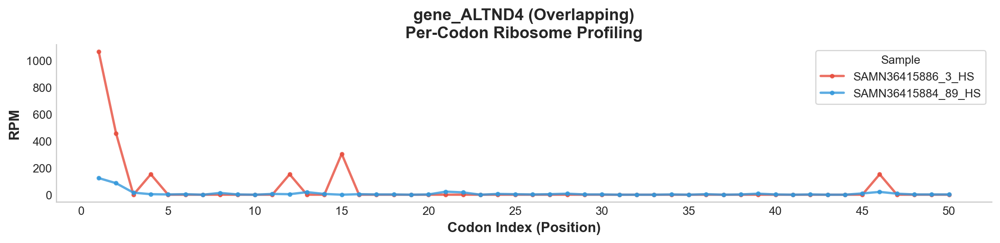

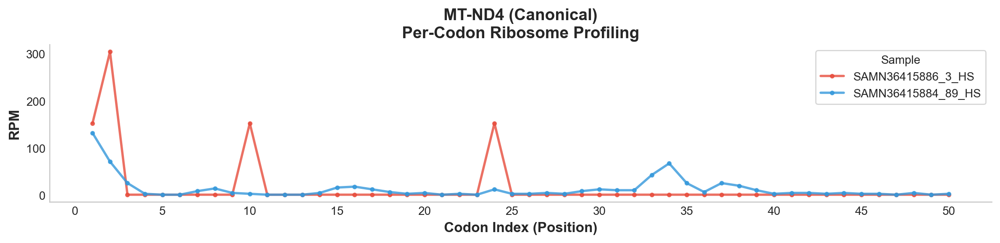


PLOTTING EXAMPLE TRANSCRIPTS


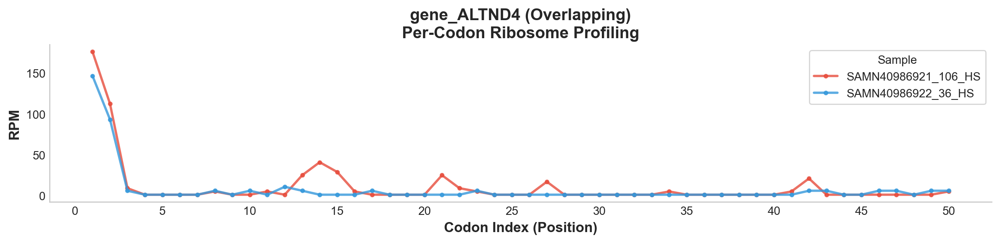

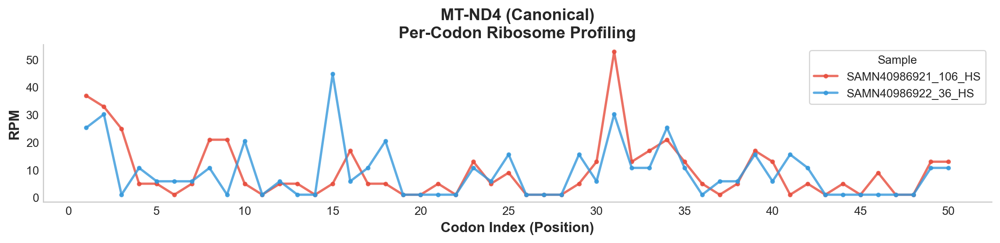

In [ ]:
reload(mra)
# ============================================================================
# EXAMPLE TRANSCRIPT PLOTS
# ============================================================================

# Plot a representative overlapping gene
print("\n" + "="*70)
print("PLOTTING EXAMPLE TRANSCRIPTS")
print("="*70)

fig1 = mra.plot_per_codon_profile(
    df_init, 
    'gene_ALTND4',
    figsize=(12, 3),
    show_window = 50,
    colors=['#E74C3C', '#3498DB', 'green'],
)
plt.show()

# Plot a representative canonical gene
fig2 = mra.plot_per_codon_profile(
    df_init,
    'ENST00000361381',
    show_window = 50,
    figsize=(12, 3),
    colors=['#E74C3C', '#3498DB', 'green'],
)
plt.show()

print("\n" + "="*70)
print("PLOTTING EXAMPLE TRANSCRIPTS")
print("="*70)

fig1 = mra.plot_per_codon_profile(
    df_init_if3, 
    'gene_ALTND4',
    figsize=(12, 3),
    show_window = 50,
    colors=['#E74C3C', '#3498DB', 'green'],
)
plt.show()

# Plot a representative canonical gene
fig2 = mra.plot_per_codon_profile(
    df_init_if3,
    'ENST00000361381',
    show_window = 50,
    figsize=(12, 3),
    colors=['#E74C3C', '#3498DB', 'green'],
)
plt.show()

In [ ]:
df.columns

Index(['transcript_id', 'gene_id', 'codon_seq', 'codon_index',
       'codon_count_sum', 'sample', 'GeneSymbol', 'Class', 'Strand', 'RPM',
       'RPM_normgene', 'RPM_cumsum', 'RPM_cumsum_normgene', 'transcript_class',
       'cell_line', 'position_1_count', 'position_2_count', 'position_3_count',
       'method'],
      dtype='object')

In [ ]:
df.gene_id.unique()

array(['gene_MOTSc', 'gene_Hum', 'gene_SHLP6', 'MT-ND1', 'MT-ND2',
       'MT-CO1', 'gene_ALTCO1', 'gene_GAU', 'MT-CO2', 'MT-ATP8',
       'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'gene_ALTND4',
       'gene_SHMOOSE', 'MT-ND5', 'MT-ND6', 'MT-CYB', 'gene_CYTB-187AA'],
      dtype=object)

In [ ]:
df

,transcript_id,gene_id,codon_seq,codon_index,codon_count_sum,sample,GeneSymbol,Class,Strand,RPM,RPM_normgene,RPM_cumsum,RPM_cumsum_normgene,transcript_class,cell_line,position_1_count,position_2_count,position_3_count,method
0,gene_MOTSc,gene_MOTSc,ATG,1,1,SAMN13331086_3_HS,NaN,NaN,NaN,8.773994,0.000033,8.773994,0.000033,Overlapping,HCT_116,0.0,1.0,0.0,mito_riboseq
1,gene_MOTSc,gene_MOTSc,AGG,2,0,SAMN13331086_3_HS,NaN,NaN,NaN,1.000000,0.000004,9.773994,0.000037,Overlapping,HCT_116,0.0,0.0,0.0,mito_riboseq
2,gene_MOTSc,gene_MOTSc,TGG,3,35,SAMN13331086_3_HS,NaN,NaN,NaN,273.089805,0.001042,282.863800,0.001080,Overlapping,HCT_116,2.0,26.0,7.0,mito_riboseq
3,gene_MOTSc,gene_MOTSc,CAA,4,49,SAMN13331086_3_HS,NaN,NaN,NaN,381.925727,0.001458,664.789527,0.002538,Overlapping,HCT_116,18.0,18.0,13.0,mito_riboseq
4,gene_MOTSc,gene_MOTSc,GAA,5,116,SAMN13331086_3_HS,NaN,NaN,NaN,902.783354,0.003446,1567.572881,0.005984,Overlapping,HCT_116,72.0,37.0,7.0,mito_riboseq
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9127,gene_CYTB-187AA,gene_CYTB-187AA,CTC,184,0,SAMN13331085_1_HS,NaN,NaN,NaN,1.000000,0.000003,304110.769406,0.999216,Overlapping,HCT_116,0.0,0.0,0.0,mito_riboseq
9128,gene_CYTB-187AA,gene_CYTB-187AA,CCA,185,4,SAMN13331085_1_HS,NaN,NaN,NaN,26.360918,0.000087,304137.130323,0.999303,Overlapping,HCT_116,0.0,3.0,1.0,mito_riboseq
9129,gene_CYTB-187AA,gene_CYTB-187AA,TTC,186,16,SAMN13331085_1_HS,NaN,NaN,NaN,102.443670,0.000337,304239.573994,0.999639,Overlapping,HCT_116,2.0,14.0,0.0,mito_riboseq
9130,gene_CYTB-187AA,gene_CYTB-187AA,CGA,187,12,SAMN13331085_1_HS,NaN,NaN,NaN,77.082753,0.000253,304316.656746,0.999893,Overlapping,HCT_116,0.0,3.0,9.0,mito_riboseq


Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTCO1_frame_occupancy_hct_116.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTND4_frame_occupancy_hct_116.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\CYTB-187AA_frame_occupancy_hct_116.png


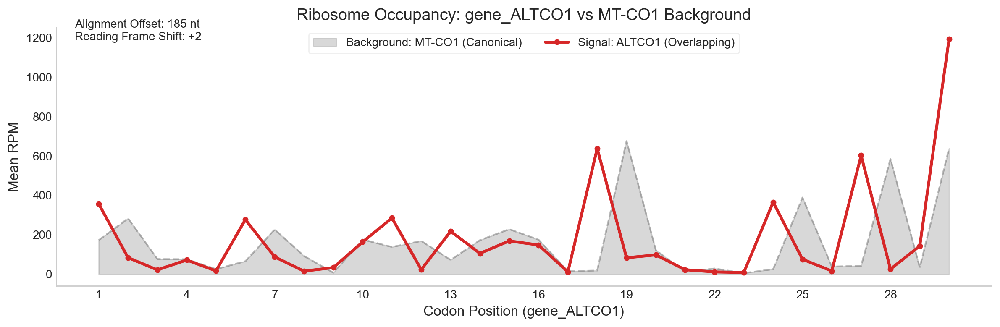

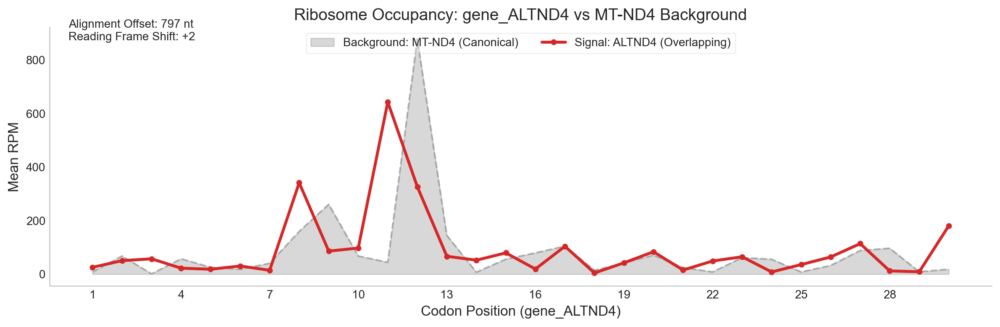

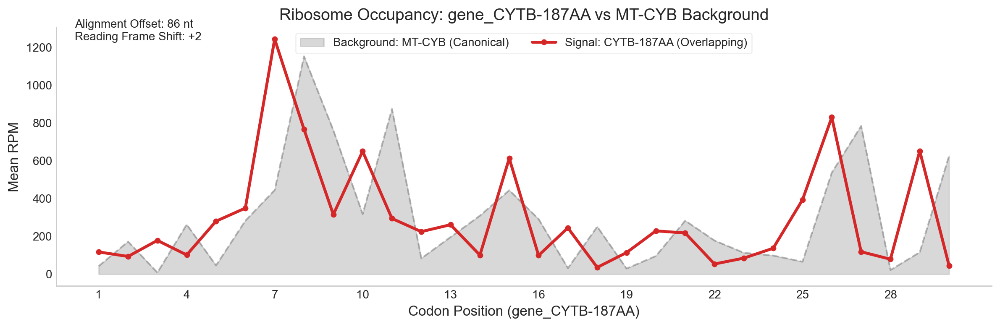

In [ ]:
reload(mra)
# ============================================================================
# SINGLE TRANSCRIPT WITH CANONICAL AND OVERLAPPING FRAMES
# ============================================================================
n_codons = 30
metric = 'RPM'
mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_ALTCO1',
    can_transcript_id='MT-CO1',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTCO1_frame_occupancy_hct_116.png')
)

mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_ALTND4',
    can_transcript_id='MT-ND4',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTND4_frame_occupancy_hct_116.png')
)

mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_CYTB-187AA',
    can_transcript_id='MT-CYB',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'CYTB-187AA_frame_occupancy_hct_116.png')
)

Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTCO1_frame_occupancy_hek_init.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTND4_frame_occupancy_hek_init.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\CYTB-187AA_frame_occupancy_hek_init.png


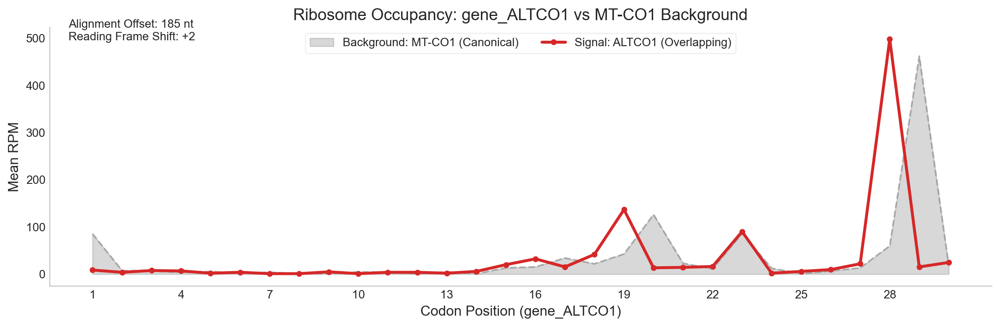

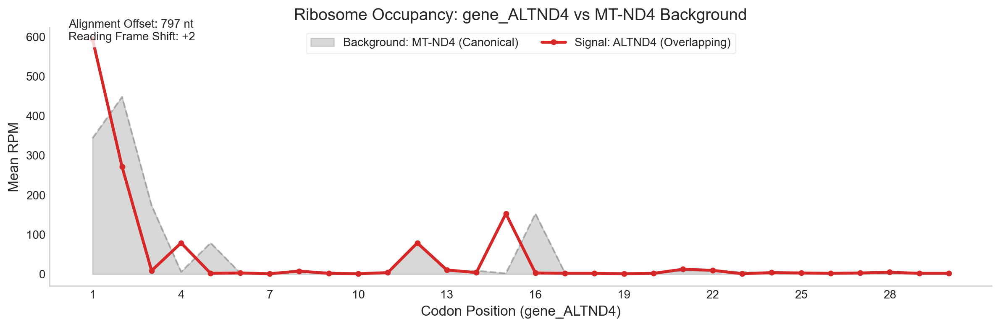

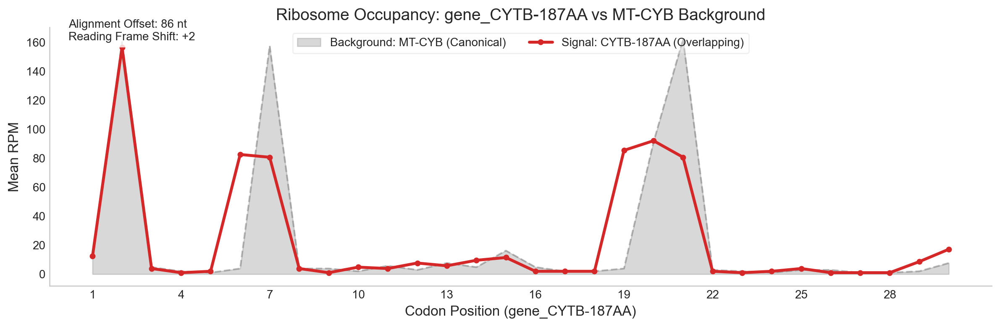

In [ ]:
reload(mra)
# ============================================================================
# SINGLE TRANSCRIPT WITH CANONICAL AND OVERLAPPING FRAMES
# ============================================================================
n_codons = 30
metric = 'RPM'
mra.occupancy_with_canonical_bg(
    df_init,
    ov_transcript_id='gene_ALTCO1',
    can_transcript_id='MT-CO1',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTCO1_frame_occupancy_hek_init.png')
)

mra.occupancy_with_canonical_bg(
    df_init,
    ov_transcript_id='gene_ALTND4',
    can_transcript_id='MT-ND4',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTND4_frame_occupancy_hek_init.png')
)

mra.occupancy_with_canonical_bg(
    df_init,
    ov_transcript_id='gene_CYTB-187AA',
    can_transcript_id='MT-CYB',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'CYTB-187AA_frame_occupancy_hek_init.png')
)

Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTCO1_frame_occupancy_hek_init_if3_ko.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTND4_frame_occupancy_hek_init_if3_ko.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\CYTB-187AA_frame_occupancy_hek_init_if3_ko.png


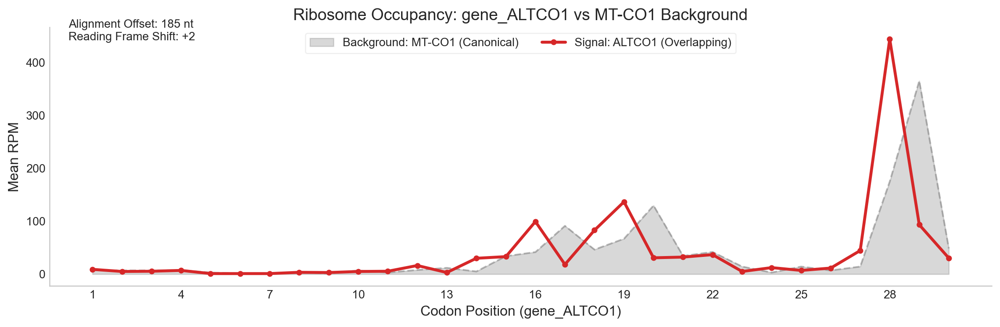

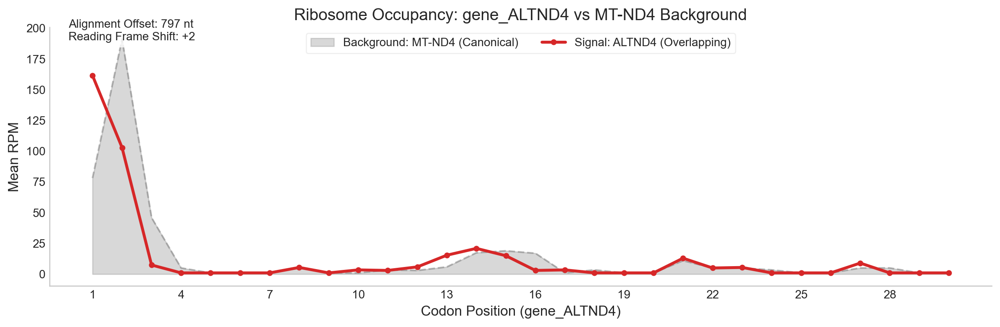

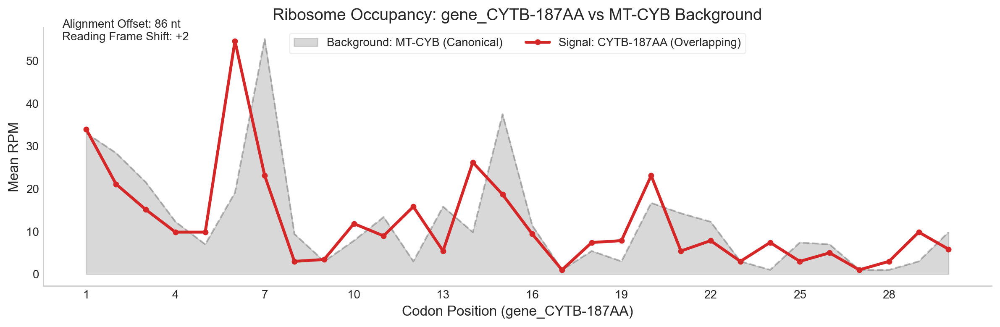

In [ ]:
reload(mra)
# ============================================================================
# SINGLE TRANSCRIPT WITH CANONICAL AND OVERLAPPING FRAMES
# ============================================================================
n_codons = 30
metric = 'RPM'
mra.occupancy_with_canonical_bg(
    df_init_if3,
    ov_transcript_id='gene_ALTCO1',
    can_transcript_id='MT-CO1',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTCO1_frame_occupancy_hek_init_if3_ko.png')
)

mra.occupancy_with_canonical_bg(
    df_init_if3,
    ov_transcript_id='gene_ALTND4',
    can_transcript_id='MT-ND4',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTND4_frame_occupancy_hek_init_if3_ko.png')
)

mra.occupancy_with_canonical_bg(
    df_init_if3,
    ov_transcript_id='gene_CYTB-187AA',
    can_transcript_id='MT-CYB',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'CYTB-187AA_frame_occupancy_hek_init_if3_ko.png')
)

Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTCO1_frame_occupancy.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\ALTND4_frame_occupancy.png
Saved figure to c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\figures\CYTB-187AA_frame_occupancy.png


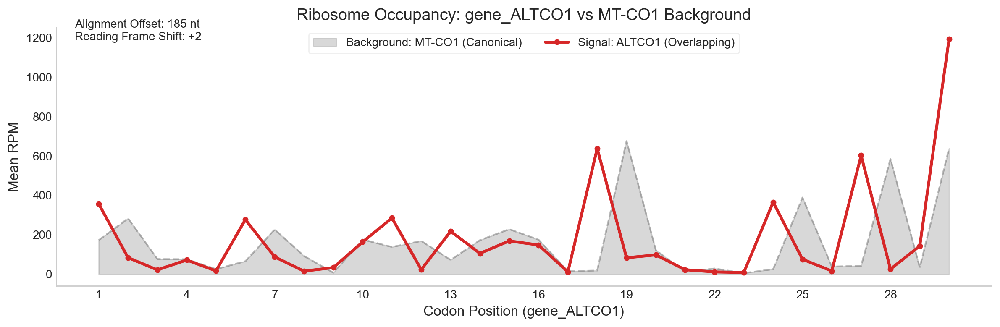

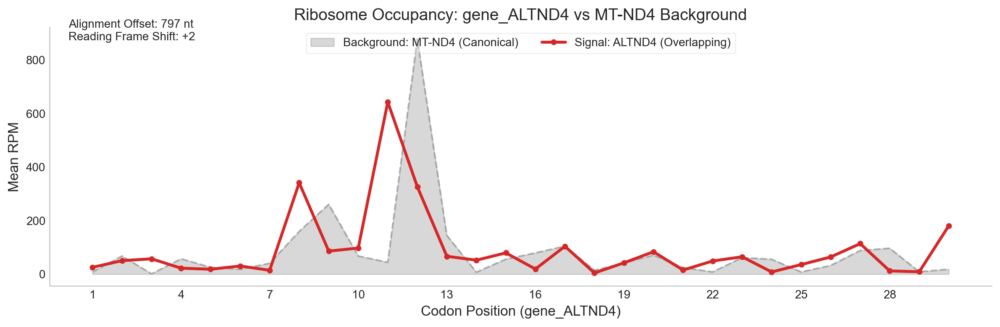

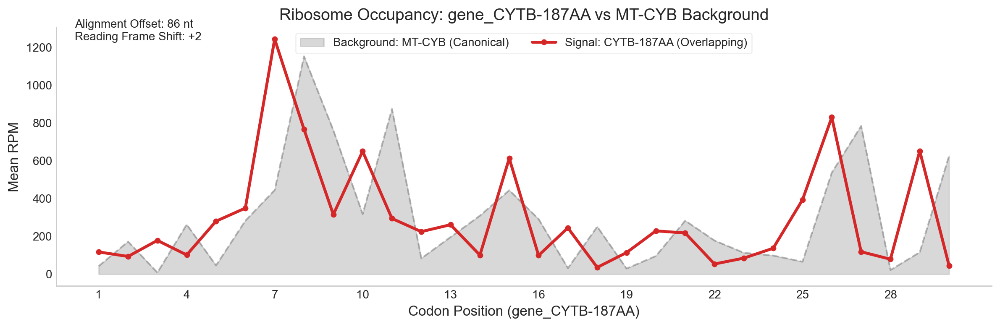

In [ ]:
reload(mra)
# ============================================================================
# SINGLE TRANSCRIPT WITH CANONICAL AND OVERLAPPING FRAMES
# ============================================================================
n_codons = 30
metric = 'RPM'
mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_ALTCO1',
    can_transcript_id='MT-CO1',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTCO1_frame_occupancy.png')
)

mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_ALTND4',
    can_transcript_id='MT-ND4',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'ALTND4_frame_occupancy.png')
)

mra.occupancy_with_canonical_bg(
    df,
    ov_transcript_id='gene_CYTB-187AA',
    can_transcript_id='MT-CYB',
    n_codons = n_codons,
    metric = metric,
    savefig_path = os.path.join(PATH, 'bin', 'mitoriboseq_analysis', 'figures', 'CYTB-187AA_frame_occupancy.png')
)

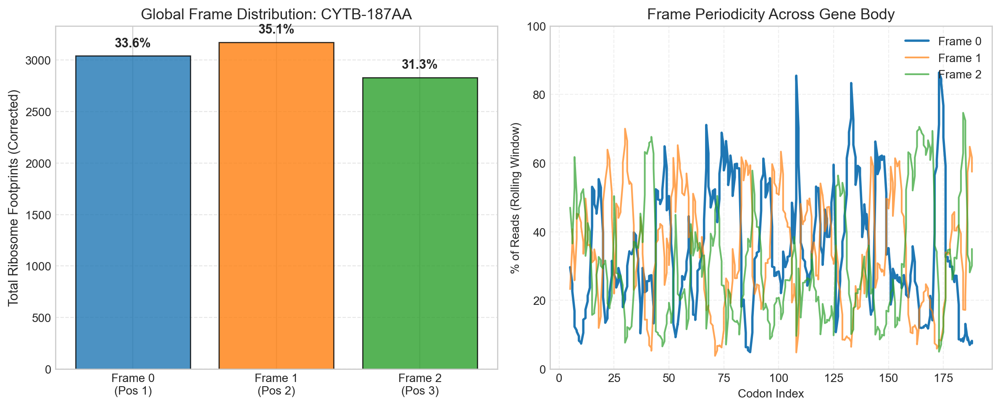

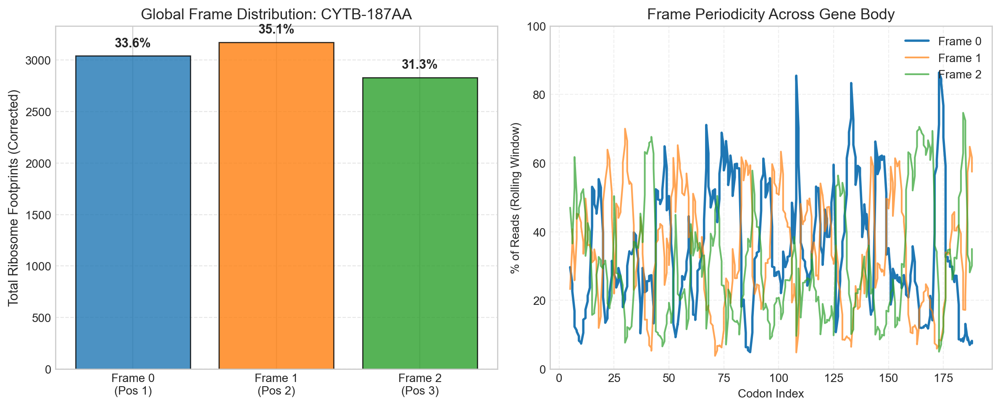

In [ ]:
reload(mra)
# ============================================================================
# SINGLE TRANSCRIPT WITH PERIODICITY
# ============================================================================
mra.plot_frame_distribution(
    df,
    gene_id = 'gene_CYTB-187AA',
    gene_label = 'CYTB-187AA',
)

In [ ]:
reload(mra)
# ============================================================================
# ALL TRANSCRIPT PLOTS
# ============================================================================
mra.plot_all_transcripts(
    df,
    output_dir = os.path.join('figures', 'hct_mitoriboseq'),
    figsize = (12,3),
    show_window = 50,
)
mra.plot_all_transcripts(
    df_init,
    output_dir = os.path.join('figures', 'hek_ini_mitoriboseq'),
    figsize = (12,3),
    show_window = 50,
)
mra.plot_all_transcripts(
    df_init_if3,
    output_dir = os.path.join('figures', 'hek_ini_if3_mitoriboseq'),
    figsize = (12,3),
    show_window = 50,
)


Saved figure to figures\hct_mitoriboseq\overlapping\gene_MOTSc_profile.png
Saved figure to figures\hct_mitoriboseq\overlapping\gene_Hum_profile.png
Saved figure to figures\hct_mitoriboseq\overlapping\gene_SHLP6_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ND1_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ND2_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-CO1_profile.png
Saved figure to figures\hct_mitoriboseq\overlapping\gene_ALTCO1_profile.png
Saved figure to figures\hct_mitoriboseq\overlapping\gene_GAU_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-CO2_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ATP8_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ATP6_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-CO3_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ND3_profile.png
Saved figure to figures\hct_mitoriboseq\canonical\MT-ND4L_profile.png
Save

{'gene_MOTSc': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP3': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP2': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP4': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP1': <Figure size 1200x300 with 1 Axes>,
 'gene_Hum': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP5': <Figure size 1200x300 with 1 Axes>,
 'gene_SHLP6': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361390': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361453': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361624': <Figure size 1200x300 with 1 Axes>,
 'gene_ALTCO1': <Figure size 1200x300 with 1 Axes>,
 'gene_GAU': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361739': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361851': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361899': <Figure size 1200x300 with 1 Axes>,
 'gene_Overlap Region': <Figure size 1200x300 with 1 Axes>,
 'ENST00000362079': <Figure size 1200x300 with 1 Axes>,
 'ENST00000361227': <Figure size 1200x300


MAIN INITIATION SIGNATURE COMPARISON


c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\mito_riboseq_analysis.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved summary figure to figures\MAIN_initiation_comparison.png


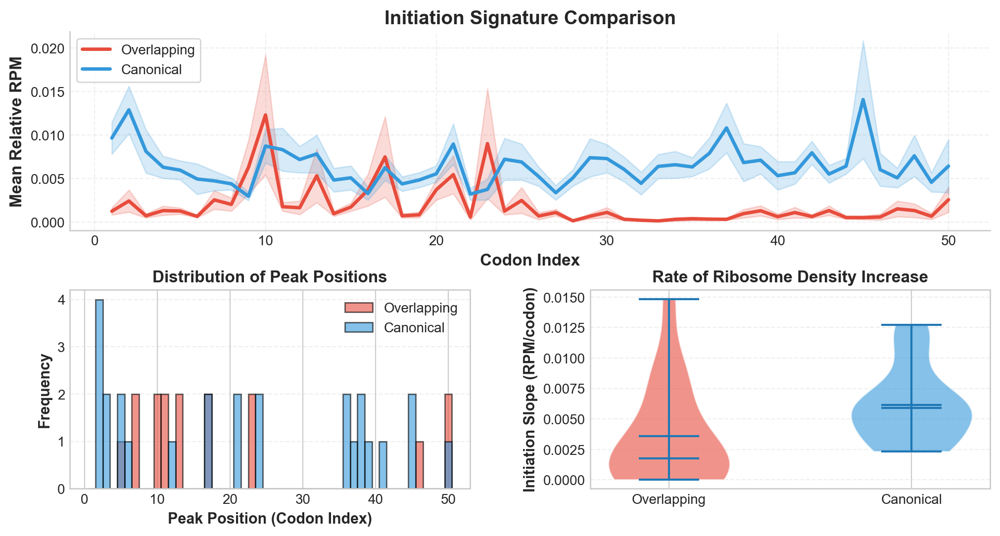


MAIN INITIATION SIGNATURE COMPARISON


c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\mito_riboseq_analysis.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved summary figure to figures\MAIN_initiation_comparison_hek_ini.png


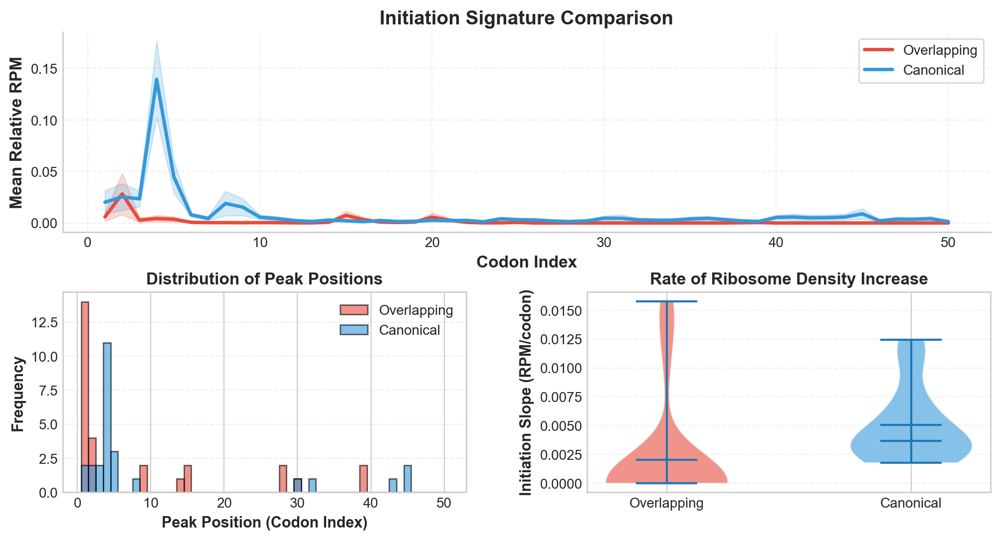

c:\Users\shtolz\Desktop\multi_function_review\bin\mitoriboseq_analysis\mito_riboseq_analysis.py:487: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved summary figure to figures\MAIN_initiation_comparison_hek_ini_if3_ko.png


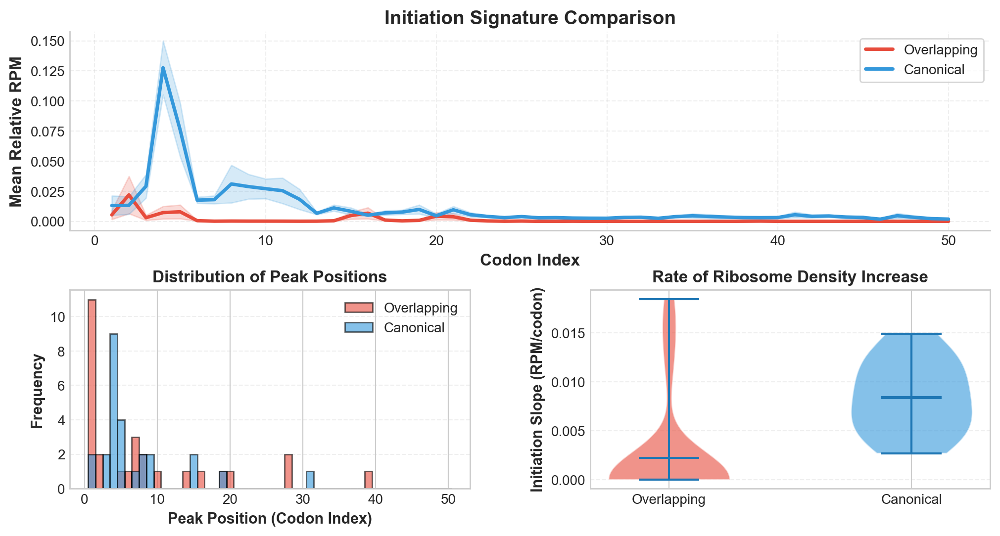

In [ ]:
reload(mra)
# ============================================================================
# MAIN COMPARATIVE ANALYSIS
# ============================================================================

print("\n" + "="*70)
print("MAIN INITIATION SIGNATURE COMPARISON")
print("="*70)

# This is your key figure comparing overlapping vs canonical genes
summary_fig = mra.plot_initiation_summary(
    df,
    window_size=50,
    figsize=(12, 6),
    colors={'Overlapping': '#E74C3C', 'Canonical': '#3498DB'},
    save_path=os.path.join('figures', 'MAIN_initiation_comparison.png')
)
plt.show()


print("\n" + "="*70)
print("MAIN INITIATION SIGNATURE COMPARISON")
print("="*70)

# This is your key figure comparing overlapping vs canonical genes
summary_fig = mra.plot_initiation_summary(
    df_init,
    window_size=50,
    figsize=(12, 6),
    colors={'Overlapping': '#E74C3C', 'Canonical': '#3498DB'},
    save_path=os.path.join('figures', 'MAIN_initiation_comparison_hek_ini.png')
)
plt.show()

summary_fig = mra.plot_initiation_summary(
    df_init_if3,
    window_size=50,
    figsize=(12, 6),
    colors={'Overlapping': '#E74C3C', 'Canonical': '#3498DB'},
    save_path=os.path.join('figures', 'MAIN_initiation_comparison_hek_ini_if3_ko.png')
)
plt.show()


In [ ]:
# Drop the following genes: [gene_Overlap Region, gene_SHLP1, gene_SHLP2, gene_SHLP3, gene_SHLP4, gene_SHLP5, ]


INITIATION PATTERN HEATMAP
Saved ridgeplot to figures\initiation_ridgeplot_normalized.png


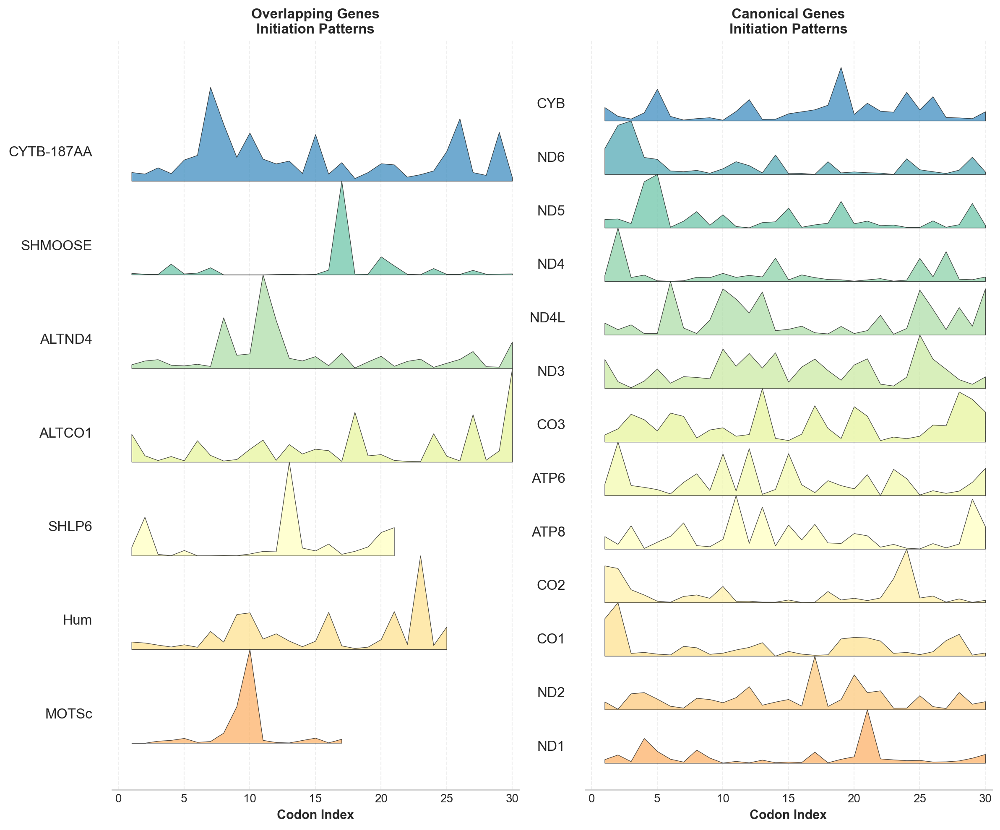

Saved ridgeplot to figures\initiation_ridgeplot_normalized_hek_init.png


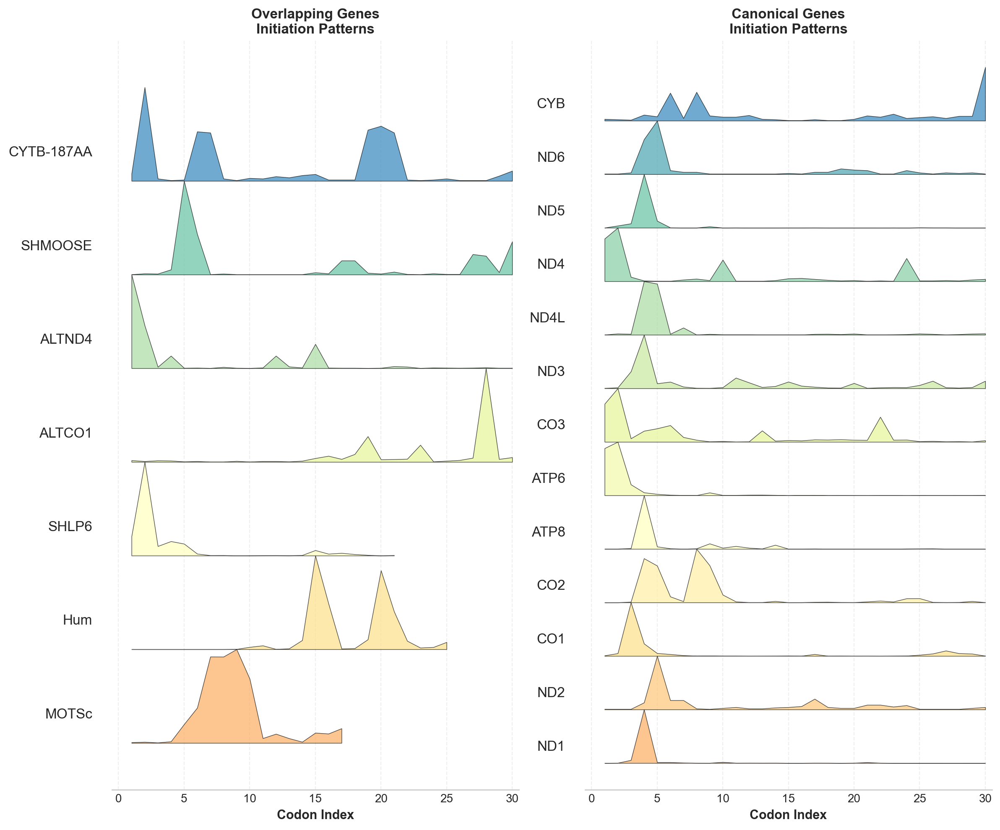

Saved ridgeplot to figures\initiation_ridgeplot_normalized_hek_if3_ko_init.png


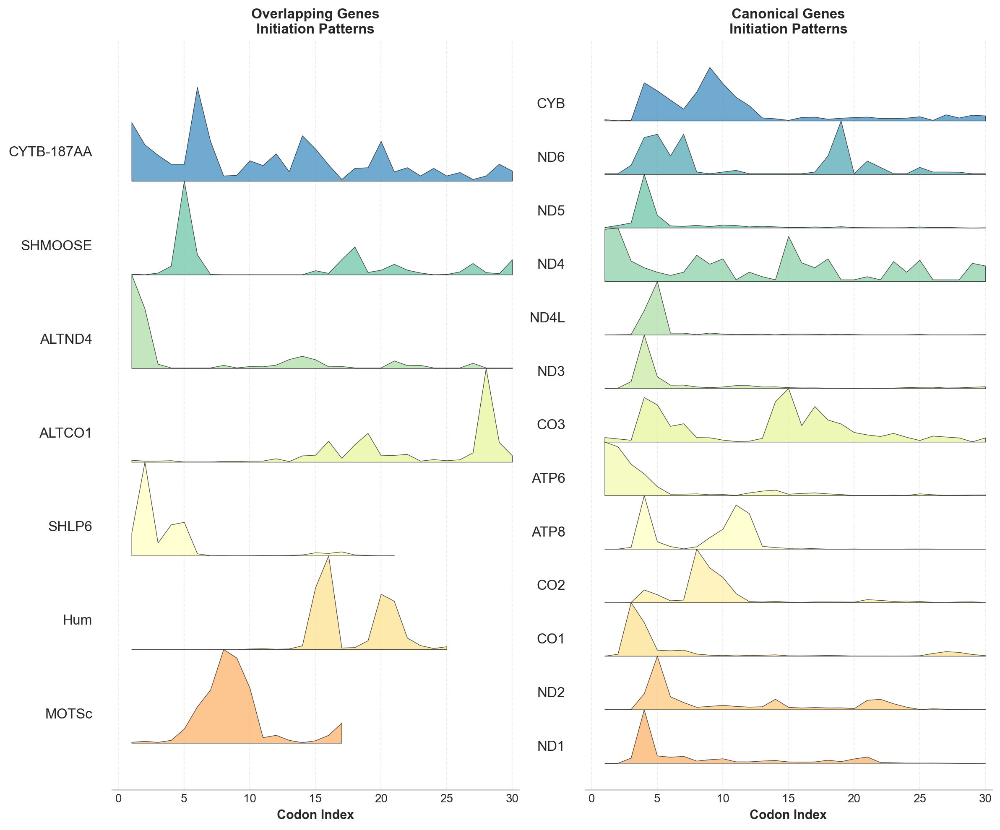

In [ ]:
reload(mra)
# ============================================================================
# HEATMAP VISUALIZATION
# ============================================================================

print("\n" + "="*70)
print("INITIATION PATTERN HEATMAP")
print("="*70)

# Normalized heatmap (shows patterns)
heatmap_fig = mra.plot_initiation_ridgeplot(
    df,
    window_size=30,
    figsize=(12, 10),
    cmap='Spectral',
    normalize_per_transcript=True,
    save_path=os.path.join('figures', 'initiation_ridgeplot_normalized.png')
)
plt.show()


heatmap_fig = mra.plot_initiation_ridgeplot(
    df_init,
    window_size=30,
    figsize=(12, 10),
    cmap='Spectral',
    normalize_per_transcript=True,
    save_path=os.path.join('figures', 'initiation_ridgeplot_normalized_hek_init.png')
)
plt.show()

heatmap_fig = mra.plot_initiation_ridgeplot(
    df_init_if3,
    window_size=30,
    figsize=(12, 10),
    cmap='Spectral',
    normalize_per_transcript=True,
    save_path=os.path.join('figures', 'initiation_ridgeplot_normalized_hek_if3_ko_init.png')
)
plt.show()

In [ ]:
reload(mra)
# ============================================================================


In [141]:
reload(mra)
# ============================================================================
# GENERATE SUMMARY TABLES
# ============================================================================
summary_stats = mra.get_transcript_summary_stats(df)
# Display the stats
display(summary_stats)


,transcript_id,transcript_class,length_codons,avg_total_cumsum_rpm,avg_mean_rpm_per_codon
0,MT-ATP6,Canonical,227,0.027128,0.004405
1,MT-ATP8,Canonical,69,0.060506,0.014493
2,MT-CO1,Canonical,514,0.026253,0.001946
3,MT-CO2,Canonical,228,0.052769,0.004386
4,MT-CO3,Canonical,262,0.127397,0.003817
5,MT-CYB,Canonical,381,0.019842,0.002625
6,MT-ND1,Canonical,319,0.044475,0.003135
7,MT-ND2,Canonical,348,0.024724,0.002874
8,MT-ND3,Canonical,116,0.047129,0.008621
9,MT-ND4,Canonical,460,0.028696,0.002174


In [136]:
# ============================================================================
# EXPORT DATA FOR FURTHER ANALYSIS
# ============================================================================

print("\n" + "="*70)
print("EXPORTING DATA")
print("="*70)

# Export metrics
metrics.to_csv(os.path.join(PATH, 'data', 'initiation_metrics.csv'), index=False)
print("✓ Saved initiation_metrics.csv")

# Export summary stats
stats.to_csv(os.path.join(PATH, 'data', 'transcript_summary_stats.csv'), index=False)
print("✓ Saved transcript_summary_stats.csv")



EXPORTING DATA
✓ Saved initiation_metrics.csv
✓ Saved transcript_summary_stats.csv



SHLP FAMILY ANALYSIS
SHLP genes found: ['gene_SHLP6']


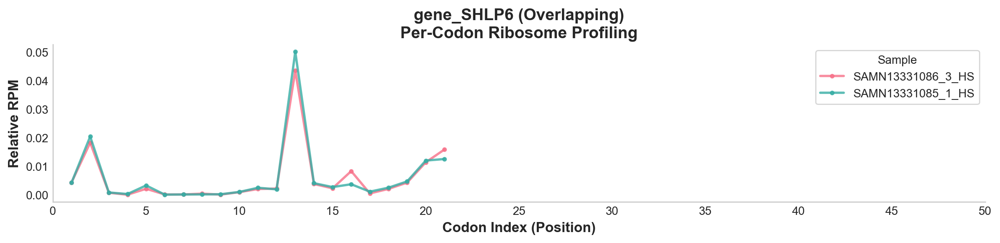

In [137]:

# ============================================================================
# CUSTOM ANALYSES (MODIFY AS NEEDED)
# ============================================================================

# Example: Look at specific gene families
print("\n" + "="*70)
print("SHLP FAMILY ANALYSIS")
print("="*70)

shlp_genes = [t for t in df['transcript_id'].unique() if 'SHLP' in t]
print(f"SHLP genes found: {shlp_genes}")

for gene in shlp_genes:  # Plot first 3
    fig = mra.plot_per_codon_profile(df, gene, show_window=50, figsize = (12,3))
    plt.show()


In [ ]:
# ============================================================================
# DONE
# ============================================================================

print("\n" + "="*70)
print("ANALYSIS COMPLETE!")
print("="*70)
print("\nGenerated files:")
print("  - MAIN_initiation_comparison.png (KEY FIGURE)")
print("  - initiation_heatmap_normalized.png")
print("  - example_MOTSc.png")
print("  - example_canonical.png")
print("  - initiation_metrics.csv")
print("  - transcript_summary_stats.csv")
print("\nNext steps:")
print("  1. Examine MAIN_initiation_comparison.png for key differences")
print("  2. Perform statistical tests on initiation_metrics.csv")
print("  3. Investigate individual transcripts of interest")
print("  4. Modify window_size parameter if needed (try 20, 30, 50)")
